# AstroCAMP Figure Atlas: Captions and Article Text

This notebook collects all plot images generated by `scripts/pasc2025_paper_analysis_plots.py` and provides:
- a caption-ready text block for each figure
- an article-ready interpretation paragraph for each figure

You can copy text directly into figure captions, Results, or Discussion sections.

In [5]:
from pathlib import Path
from IPython.display import display, Markdown, Image

BASE = Path.cwd()
if not (BASE / 'scripts').exists():
    BASE = BASE.parent

def show_figure(entry):
    img_path = BASE / entry['file']
    display(Markdown(f"## {entry['title']}"))
    display(Markdown(f"**File:** `{entry['file']}`"))
    if img_path.exists():
        display(Image(filename=str(img_path)))
    else:
        display(Markdown(f"Image not found: `{entry['file']}`"))

    if entry.get('method'):
        display(Markdown("**Method**"))
        display(Markdown(entry['method']))

    display(Markdown("**Caption (ready to use)**"))
    display(Markdown(entry['caption']))

    interpretation = entry.get('interpretation', entry.get('article', ''))
    if interpretation:
        display(Markdown("**Interpretation**"))
        display(Markdown(interpretation))

    if entry.get('discussion'):
        display(Markdown("**Discussion**"))
        display(Markdown(entry['discussion']))
    display(Markdown('---'))

## Plot 1: Wall Time vs Work Proxy

**File:** `scripts/plot1_walltime_vs_workproxy.png`

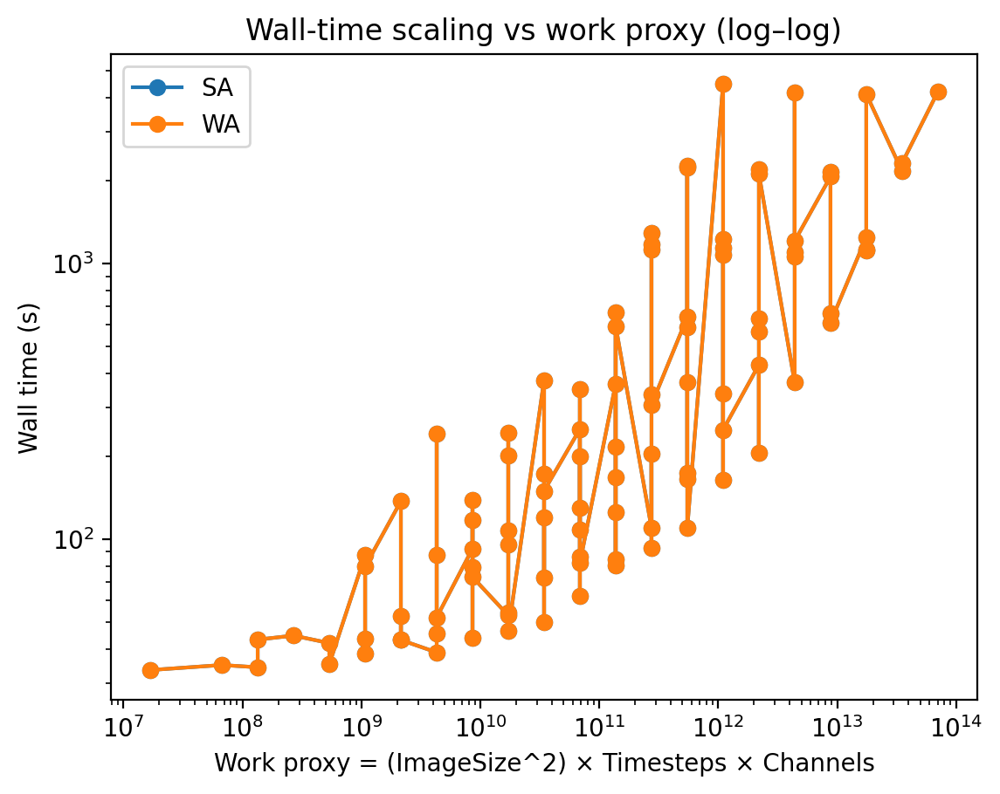

**Caption (ready to use)**

Wall time scales with workload proxy (ImageSize$^2$×Timesteps×Channels) on log-log axes. The slope indicates non-linear cost growth as workload increases, and differences between curves indicate location-dependent runtime characteristics.

**Interpretation**

This figure establishes the baseline scalability trend: runtime increases strongly with computational demand. The location split quantifies infrastructure effects and motivates downstream decomposition into throughput, energy, and utilization metrics.

---

## Plot 2: Throughput vs Work Proxy

**File:** `scripts/plot2_throughput_vs_workproxy.png`

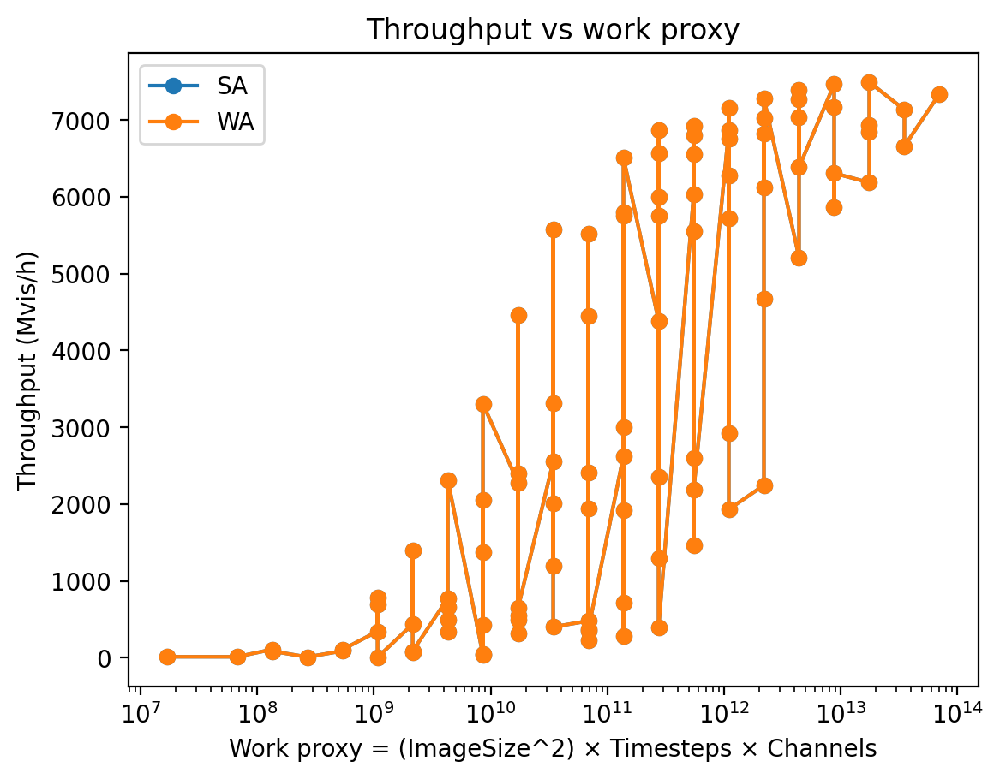

**Caption (ready to use)**

Throughput (Mvis/h) as a function of workload proxy shows an initial increase followed by flattening, consistent with resource saturation at larger scales.

**Interpretation**

The observed plateau indicates that additional workload no longer translates into proportional throughput gains. This is the first direct evidence of diminishing returns, later explained using kernel timing and active-window utilization analyses.

---

## Plot 3: Energy vs Work Proxy

**File:** `scripts/plot3_energy_vs_workproxy.png`

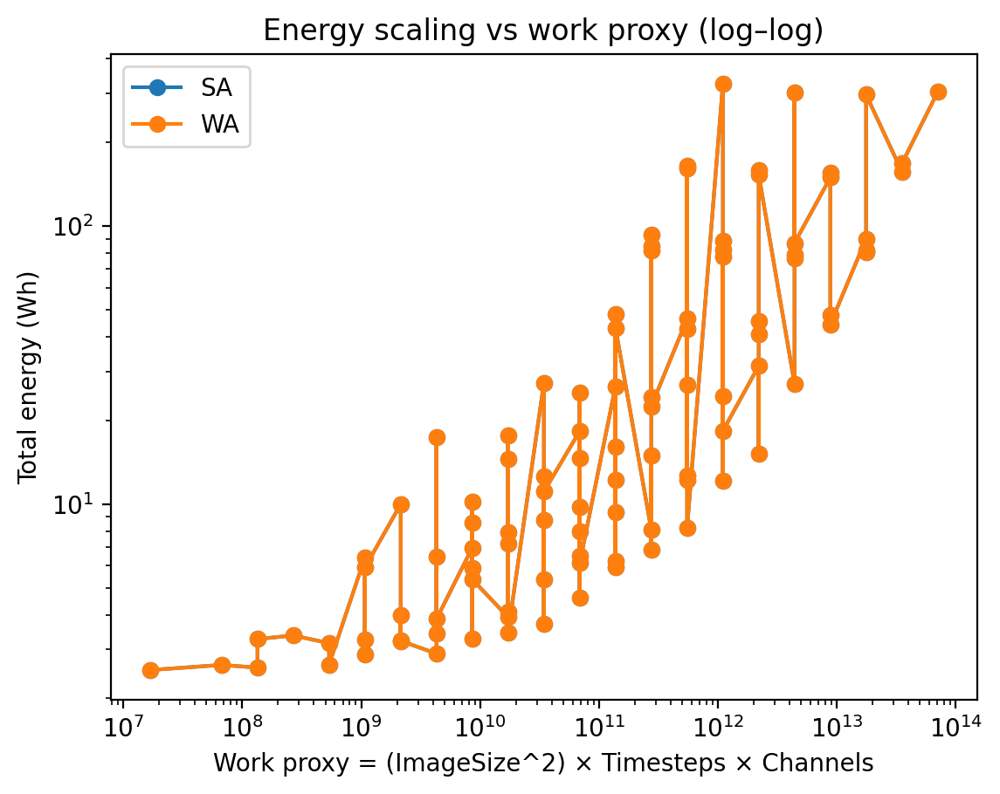

**Caption (ready to use)**

Total energy consumption rises with workload proxy on log-log axes, with location-specific offsets reflecting platform and energy-mix differences.

**Interpretation**

Unlike throughput, energy continues to grow even in saturation regimes. This divergence underpins the efficiency gap: energy scales with runtime burden while useful work growth weakens.

---

## Plot 4: Static Energy Fraction vs Work Proxy

**File:** `scripts/plot4_static_fraction_vs_workproxy.png`

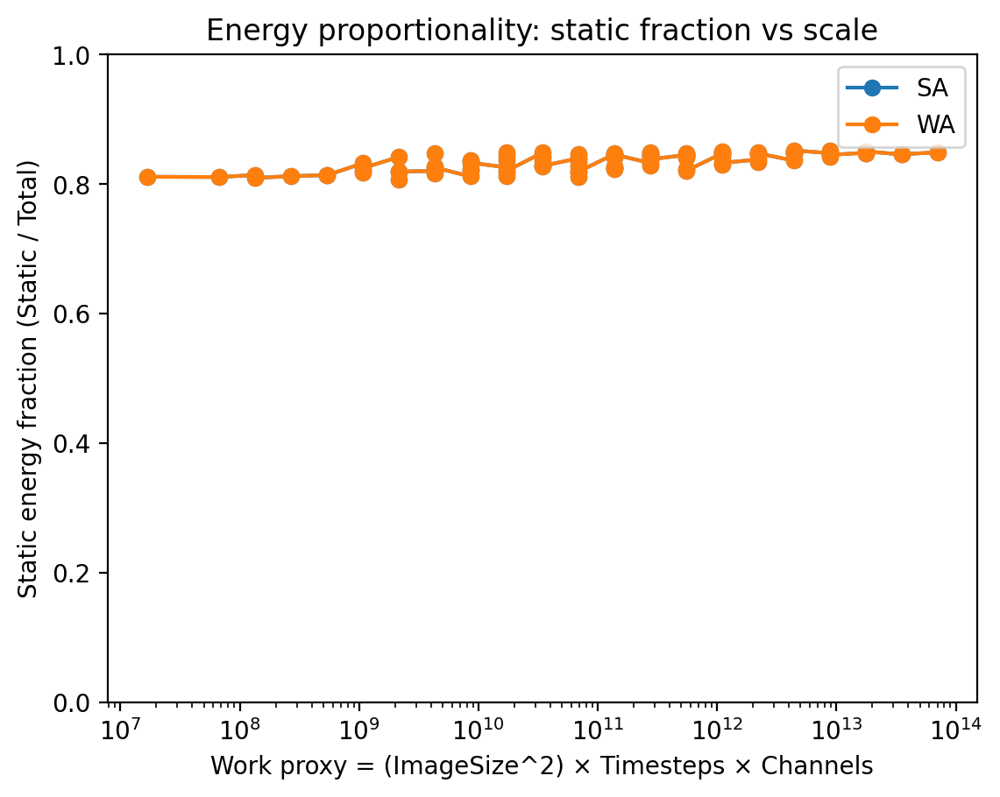

**Caption (ready to use)**

Static-to-total energy fraction across workload scale. Larger static fractions indicate weaker energy proportionality.

**Interpretation**

As scale increases, persistent static overhead contributes more strongly to total energy in several regimes. This helps explain why total energy can keep rising despite throughput plateaus.

---

## Plot 5: Energy Efficiency vs Work Proxy

**File:** `scripts/plot5_mvis_per_kwh_vs_workproxy.png`

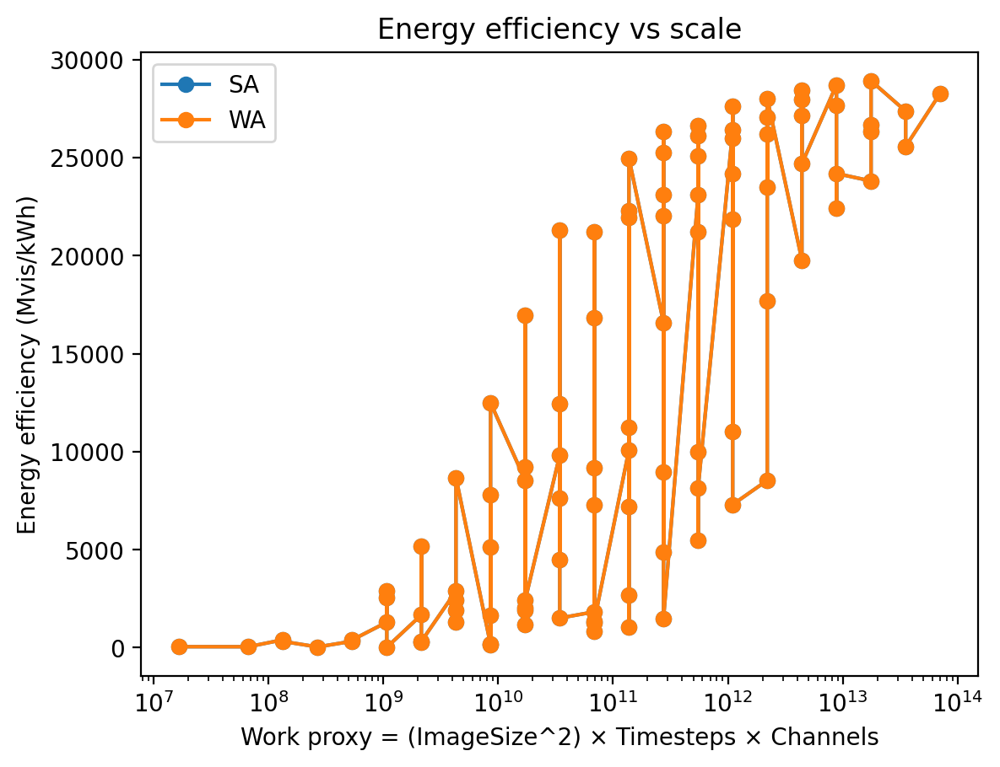

**Caption (ready to use)**

Energy efficiency (Mvis/kWh) over workload proxy highlights where scaling remains cost-effective versus where efficiency saturates or declines.

**Interpretation**

Efficiency behavior summarizes the interaction between throughput gain and energy growth. Regions with flat or dropping Mvis/kWh correspond to the onset of practical saturation.

---

## Plot 6: Energy-Time Tradeoff

**File:** `scripts/plot6_energy_time_scatter.png`

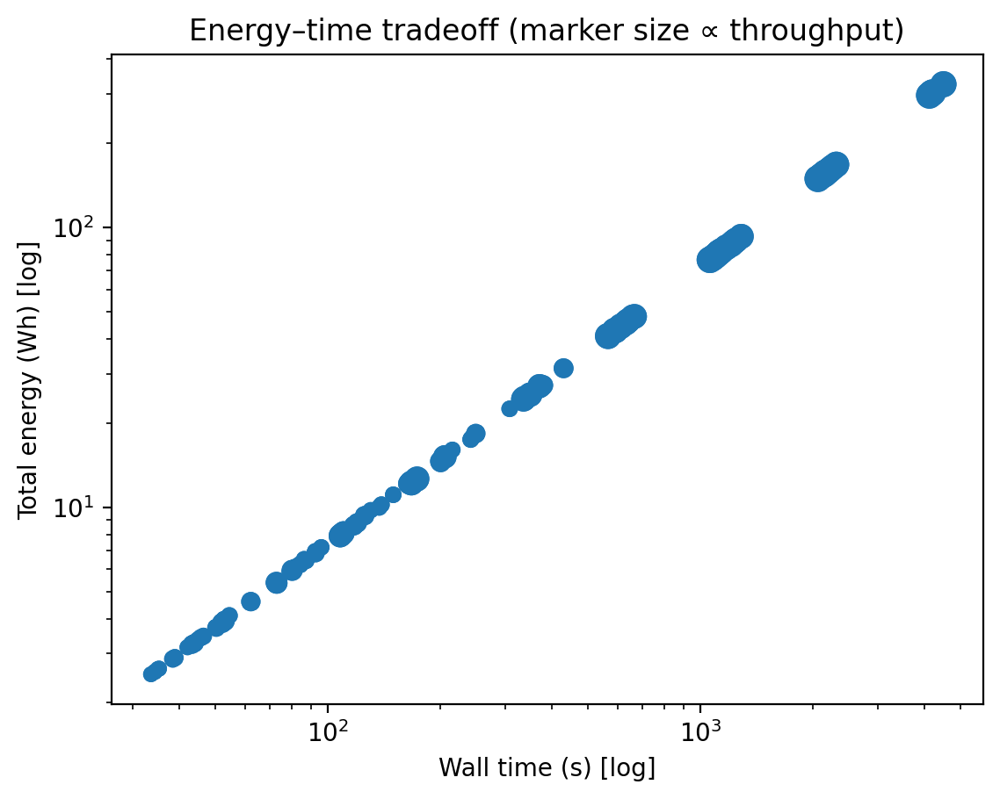

**Caption (ready to use)**

Energy-time scatter (log-log), with marker size proportional to throughput. The figure reveals Pareto-like tradeoffs between speed and energy cost.

**Interpretation**

Points that move up-right represent jointly higher runtime and energy, while larger markers indicate productivity. The cloud structure helps identify regimes where faster execution no longer improves efficiency proportionally.

---

## Plot 7: Power vs Throughput

**File:** `scripts/plot7_power_vs_throughput.png`

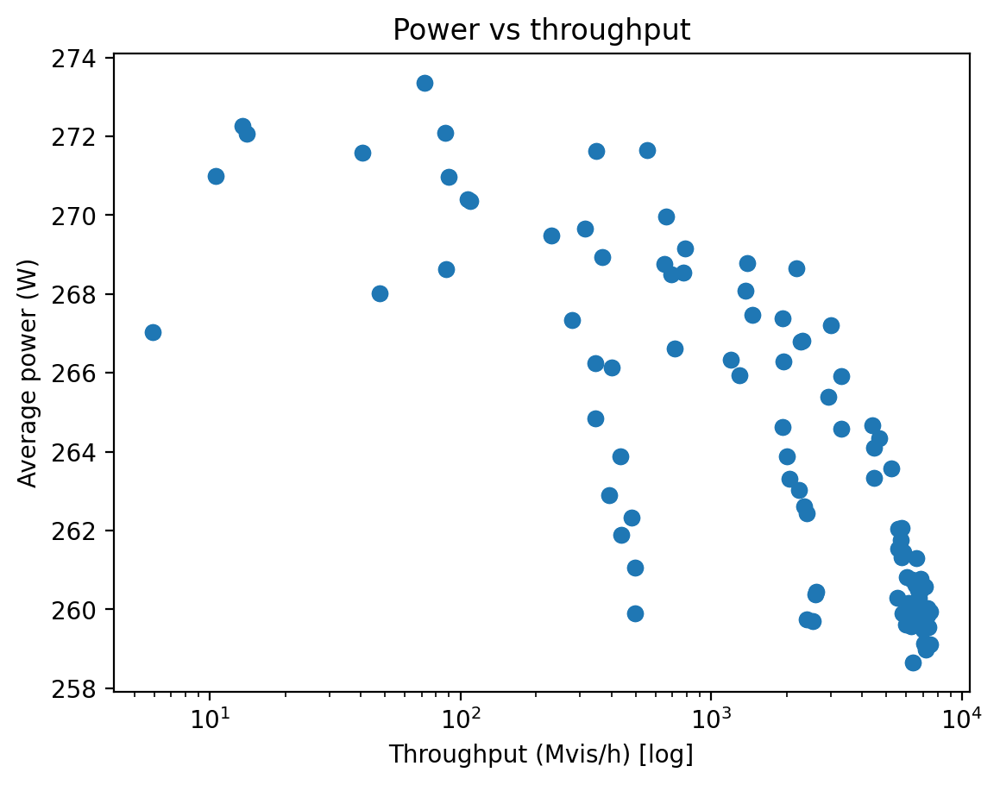

**Caption (ready to use)**

Average power versus throughput indicates whether higher performance is driven by better utilization or by higher instantaneous power draw.

**Interpretation**

The trend separates power-limited from utilization-limited behavior. If throughput saturates while power remains high, overall energy efficiency deteriorates.

---

## Plot 8: Carbon Efficiency vs Work Proxy

**File:** `scripts/plot8_mvis_per_kgco2_vs_workproxy.png`

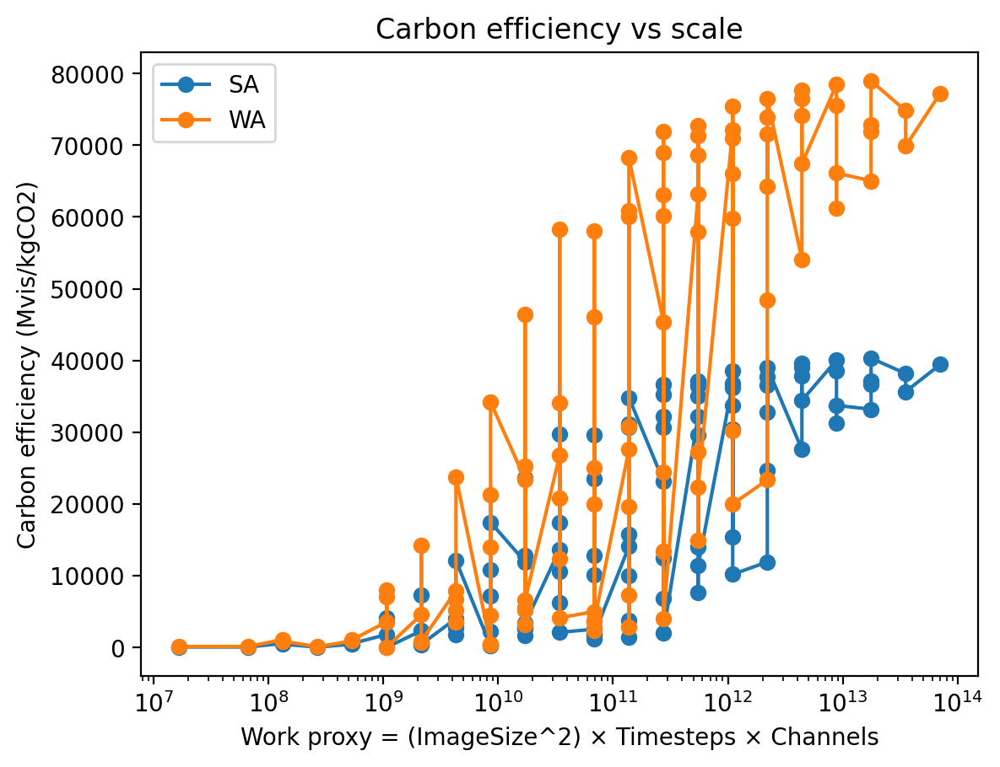

**Caption (ready to use)**

Carbon efficiency (Mvis/kgCO2) across workload scale. Curves capture the combined effects of runtime, energy draw, and carbon intensity.

**Interpretation**

Carbon-aware performance does not necessarily match pure throughput trends. This figure supports sustainability-aware operating point selection under saturation.

---

## Plot 9: Flagship Faceted Energy and Throughput View

**File:** `scripts/plot9_flagship_energy_stack_throughput_facets.png`

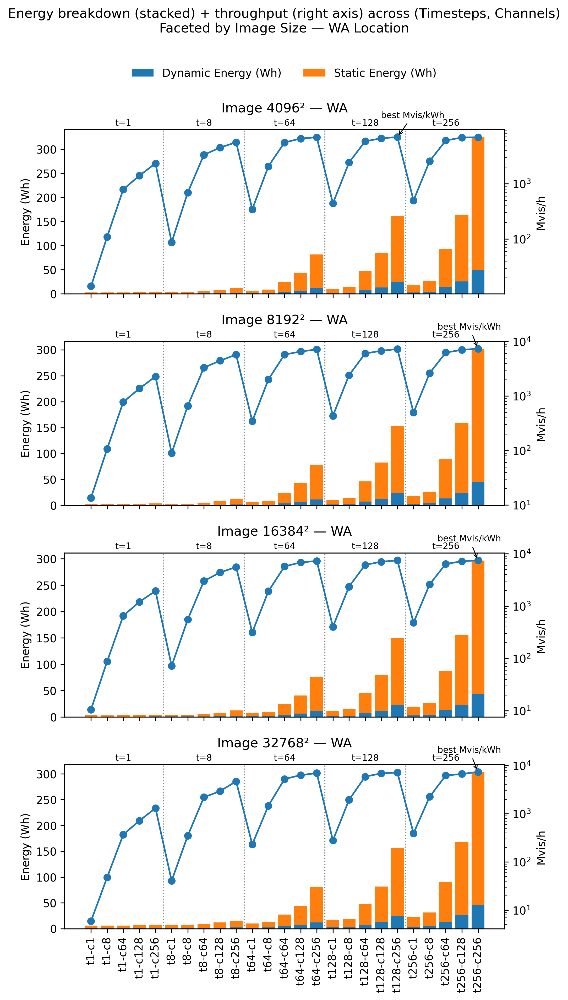

**Caption (ready to use)**

Faceted stacked energy breakdown (dynamic + static) with throughput overlay, grouped by timestep and channel combinations. Dotted separators and top `t=` guides indicate workload grouping.

**Interpretation**

This flagship figure exposes the key phenomenon of the study: throughput growth weakens while total energy keeps increasing across larger configurations. Group separation by timestep clarifies that saturation appears systematically rather than as a single outlier.

---

## Plot 10: Carbon and Cost Breakdown with Efficiency Overlays

**File:** `scripts/plot10_carbon_cost_efficiency_facets.png`

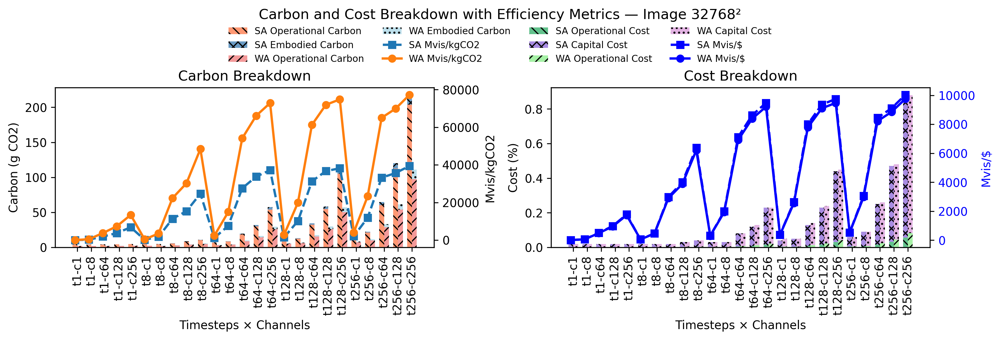

**Caption (ready to use)**

Largest-image comparison of carbon and cost components with efficiency overlays, enabling simultaneous analysis of environmental and economic tradeoffs.

**Interpretation**

The figure links decomposition (operational vs embodied/capital) with delivered work per impact unit. It supports multi-objective decisions beyond raw runtime.

---

## Plot 11 (t=64): Saturation and Overhead from Parsed Logs

**File:** `scripts/plot11_idg_gpu_saturation_overhead_from_logs_t64.png`

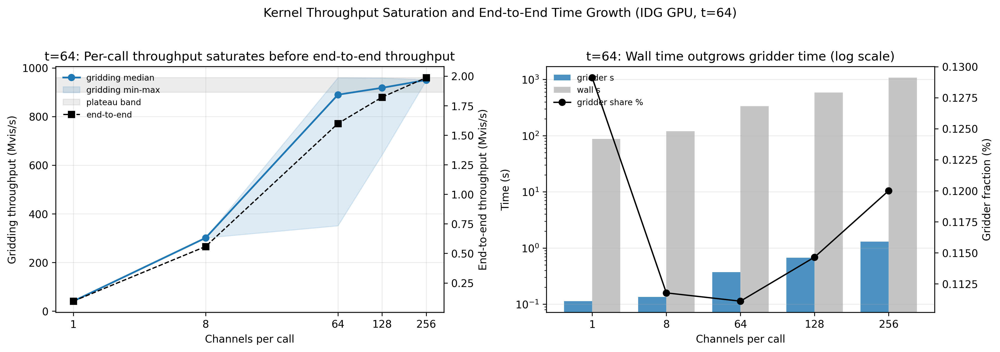

**Caption (ready to use)**

For fixed t=64, per-call gridding throughput, wall-time growth, and gridder share indicate where overhead dominates beyond kernel-level gains.

**Interpretation**

This panel isolates a low-timestep regime and shows that end-to-end behavior is not fully explained by kernel throughput alone. Non-gridder components increasingly shape runtime.

---

## Plot 11 (t=256): Saturation and Overhead from Parsed Logs

**File:** `scripts/plot11_idg_gpu_saturation_overhead_from_logs_t256.png`

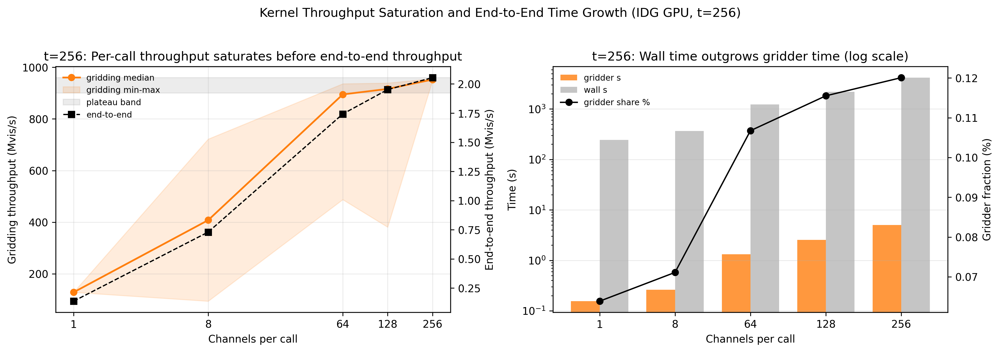

**Caption (ready to use)**

For fixed t=256, scaling exhibits stronger wall-time expansion relative to gridder-only gains, consistent with system-level bottlenecks at larger work units.

**Interpretation**

Compared to t=64, the higher timestep regime emphasizes persistent overhead and reinforces the saturation narrative under heavier workloads.

---

## Plot 11 (Legacy Combined Variant)

**File:** `scripts/plot11_idg_gpu_saturation_overhead_from_logs.png`

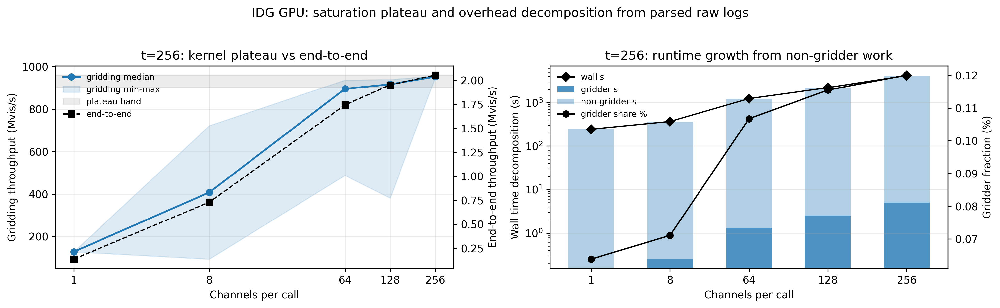

**Caption (ready to use)**

Legacy combined version of parsed-log saturation diagnostics. Kept for completeness and backward comparison.

**Interpretation**

This figure is useful for tracing analysis evolution, but timestep-separated versions are preferred for publication clarity.

---

## Plot 12: Parsed-Log Sanity Checks

**File:** `scripts/plot12_idg_gpu_sanity_checks_from_logs.png`

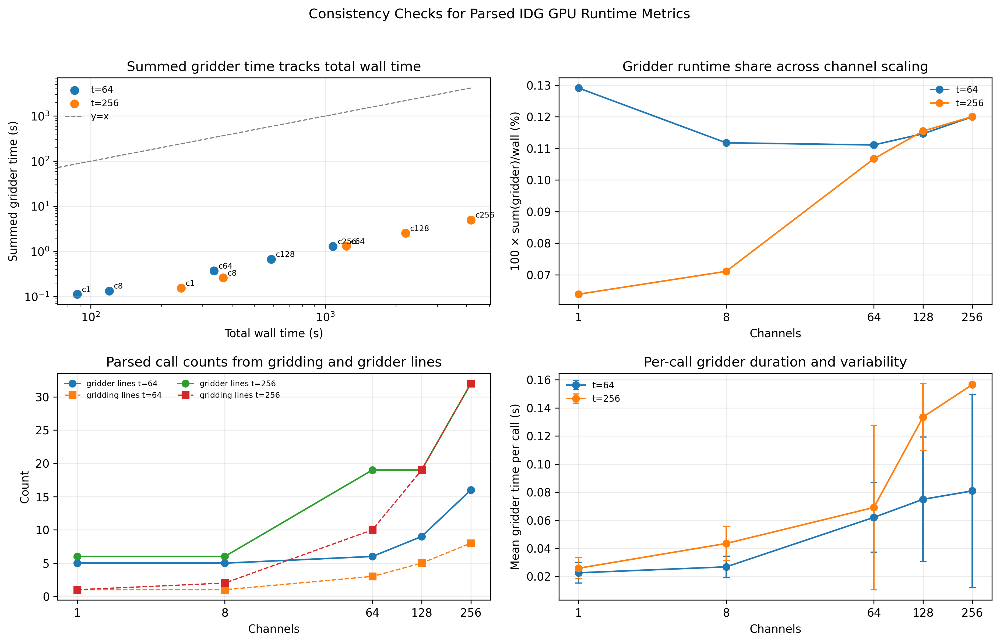

**Caption (ready to use)**

Consistency checks across wall time, summed kernel time, parsed call counts, and variability metrics validate parser fidelity and metric interpretability.

**Interpretation**

These diagnostics establish trust in subsequent mechanistic plots by showing coherent internal relationships in the raw log-derived quantities.

---

## Plot 13: Gridder-to-Wall Ratio Focus

**File:** `scripts/plot13_idg_gpu_gridder_wall_ratio_focus.png`

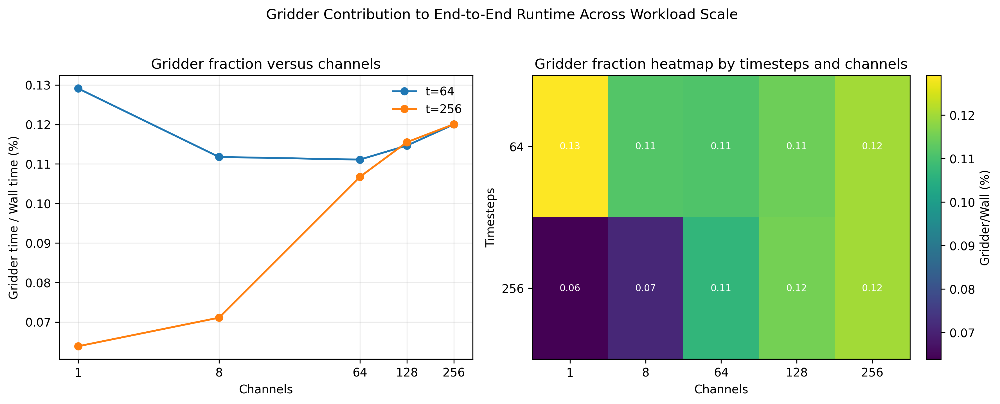

**Caption (ready to use)**

Gridder fraction of wall time across timesteps/channels, including heatmap summary, highlights when non-gridder overhead dominates.

**Interpretation**

The ratio perspective quantifies why kernel-level speedups alone cannot explain end-to-end scaling behavior in high-load regimes.

---

## Plot 14: CPU vs GPU End-to-End Comparison

**File:** `scripts/plot14_cpu_vs_gpu_walltime_from_bench.png`

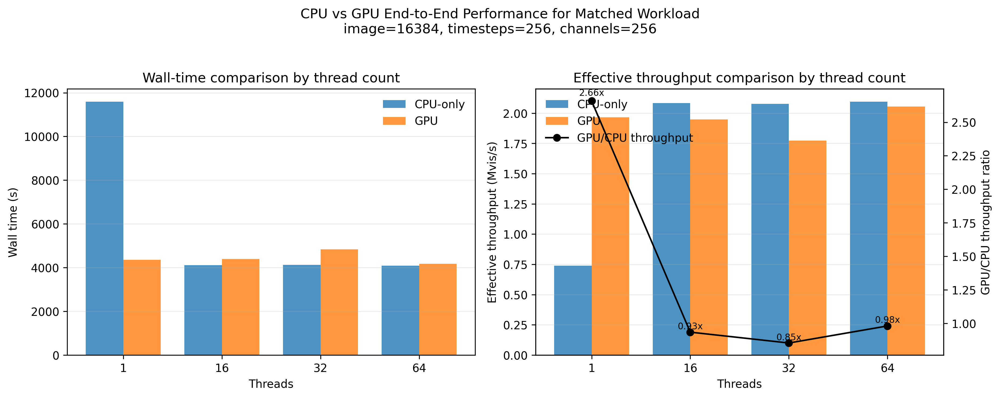

**Caption (ready to use)**

Matched-workload wall-time and effective-throughput comparison between CPU-only and GPU modes across thread counts.

**Interpretation**

This figure benchmarks accelerator benefit in full pipeline context, separating algorithmic speedup from runtime orchestration effects.

---

## Plot 15: Dedicated Explanation of Plot9 Saturation

**File:** `scripts/plot15_explain_plot9_saturation.png`

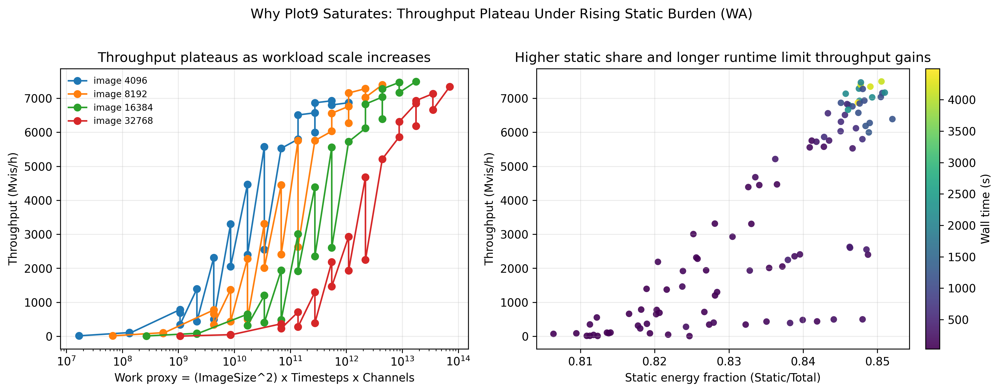

**Caption (ready to use)**

Throughput plateau and static-burden relationship for WA workloads, showing that larger runs incur increasing fixed-cost share.

**Interpretation**

This is the bridge figure from descriptive behavior to mechanism: static overhead and longer runtime jointly limit throughput improvements.

---

## Plot 16: Mechanistic Raw-Log Explainer

**File:** `scripts/plot16_idg_gpu_raw_log_explainer.png`

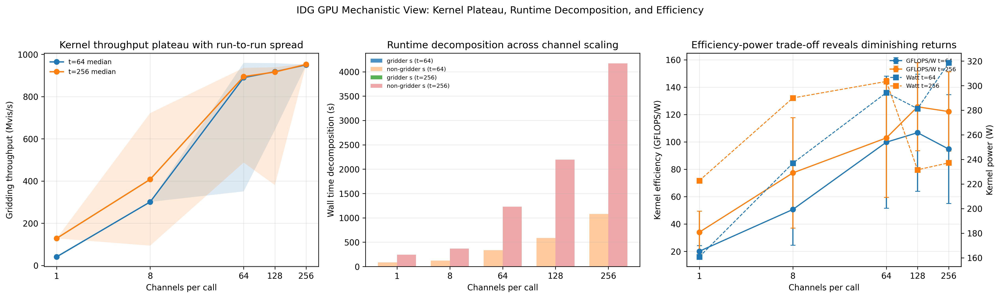

**Caption (ready to use)**

Three-view diagnostic combining throughput plateau, runtime decomposition, and efficiency-power trend from parsed kernel logs.

**Interpretation**

By combining kernel and system-level views, this figure explains why local kernel efficiency metrics do not fully map to end-to-end throughput.

---

## Plot 17: Kernel Breakdown Across Image/Timesteps/Channels

**File:** `scripts/plot17_kernel_time_breakdown_pasc25_16c.png`

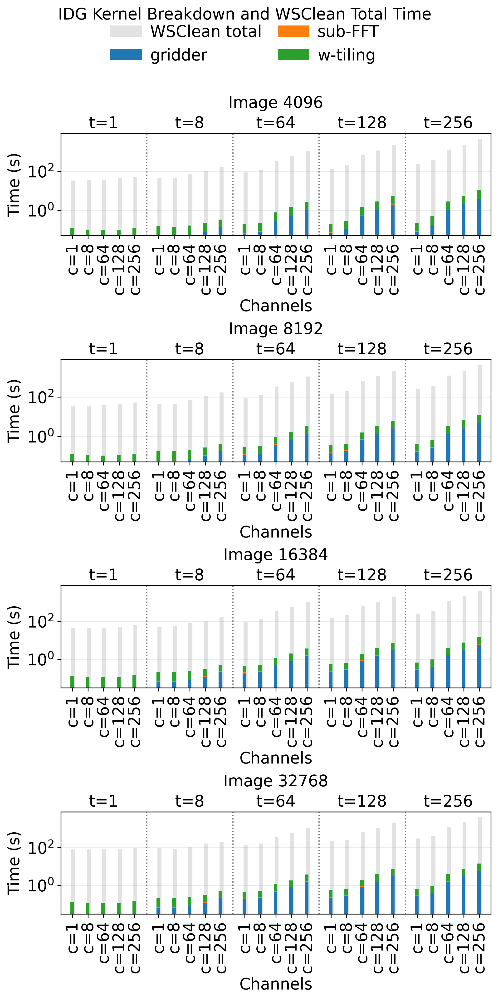

**Method**

Plot 17 is built from all matching raw logs in `astroCAMP-bench/pasc25_16c`. The parser explicitly sums only the sub-kernel log lines that start with `gridder:`, `sub-fft:`, and `wtiling:` for each run, and takes elapsed wall time from the `Elapsed ...` line. It does not use the `|gridder:` or other leading-`|` summary records for the stacked kernel bars. The figure groups runs by image size, timesteps, and channels, then plots the median summed sub-kernel times together with the full WSClean wall time on a log scale.

**Caption (ready to use)**

Kernel-time composition versus total WSClean wall time across the full `(image size, t, c)` workload grid, using explicit summed IDG sub-kernel log lines (`gridder:`, `sub-fft:`, `wtiling:`) rather than the `|...` summary records. The log scale shows that the parsed IDG kernel contribution remains far below end-to-end wall time, while image-size effects are much clearer in summed sub-kernel time than in the total runtime.

**Interpretation**

This global view shows that image size is not the dominant driver of end-to-end wall time in this regime, even though it still increases the explicit IDG sub-kernel time. For matched timestep and channel counts, wall time often changes only weakly across image sizes, while the summed sub-kernel bars grow more systematically. The key implication is that most total runtime accumulates outside the explicitly logged IDG sub-kernels, so image-size effects are visually compressed in the end-to-end metric. That is why the later largest-image figures are needed: they focus on the regime where non-kernel costs, utilization behavior, and throughput saturation can be discussed more directly.

---

## Plot 17b: Kernel Breakdown with Disk Footprint Overlay

**File:** `scripts/plot17b_kernel_time_breakdown_with_disk.png`

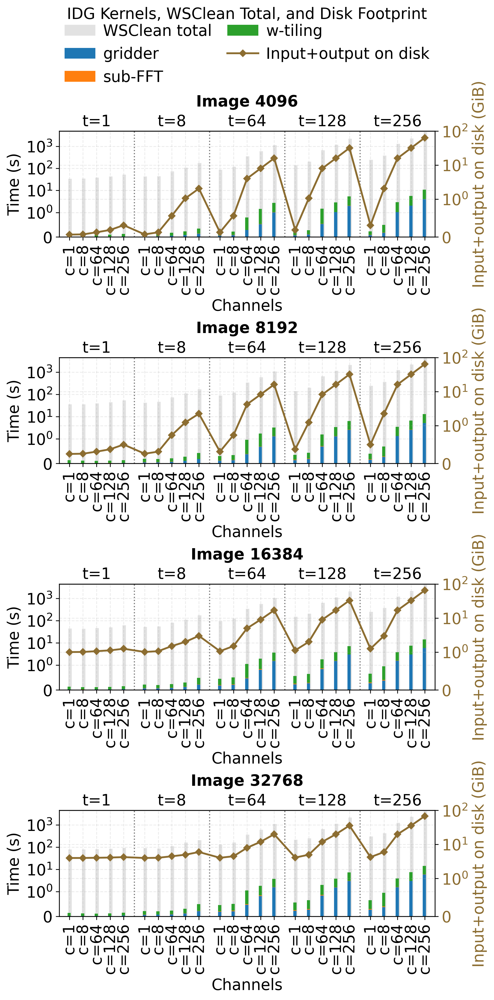

**Method**

Plot 17b uses the same `pasc25_16c` raw-log parser as Plot 17, so the stacked bars again come only from the explicit `gridder:`, `sub-fft:`, and `wtiling:` sub-kernel lines plus the elapsed wall-time line. It then merges each `(image size, t, c)` configuration with the locally generated `problem_size_memory_table.csv` and overlays the estimated input-plus-output disk footprint on a secondary axis. That footprint is computed as `input_on_disk_est_bytes = n_vis * 8 B` for one complex FP32 visibility payload, `output_bytes = im_size^2 * 4 B` for one FP32 Stokes-I image plane, and `total_disk_gib = (input_on_disk_est_bytes + output_bytes) / 1024^3`. The overlay therefore does not come from the raw logs; it comes from the derived problem-size table that maps the same workload coordinates to estimated on-disk input and output sizes.

**Caption (ready to use)**

Variant of Plot 17 that keeps the explicit-IDG sub-kernel versus wall-time decomposition from the raw `pasc25_16c` logs and adds a secondary-axis line for the estimated total disk footprint (`input + output`) of each workload. The stacked bars still use only the explicit sub-kernel lines, while the right-axis overlay summarizes problem-size growth in storage terms.

**Interpretation**

The added disk-footprint line makes clear that larger workloads do not just change runtime; they also increase the amount of input and output state associated with the problem. However, the main timing conclusion remains unchanged from Plot 17: the explicit IDG sub-kernel contribution stays small relative to total WSClean wall time. The overlay is useful because it separates two different notions of scale, namely computational kernel time and problem-state size on disk. Read together, the figure shows that larger problem footprints do not map directly to proportional wall-time growth, again pointing to surrounding software and orchestration costs as the dominant end-to-end factor.

---

## Plot 18: Largest-Image Detailed View

**File:** `scripts/plot18_largest_image_kernel_wall_throughput.png`

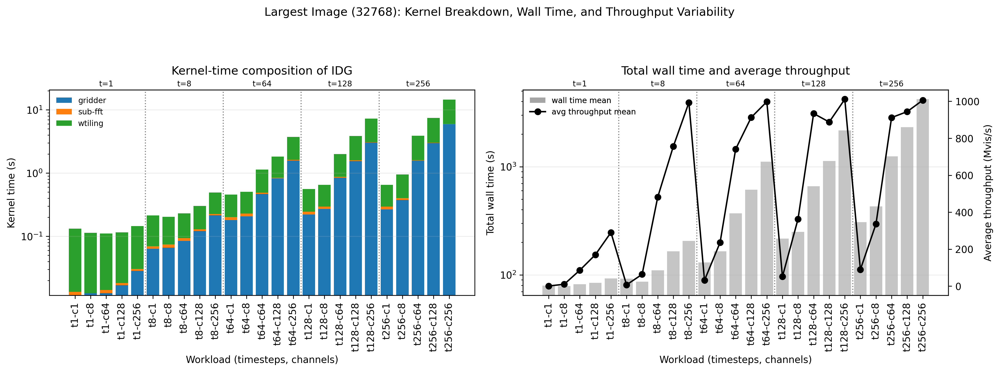

**Method**

Plot 18 filters the `pasc25_16c` summary to the largest image only and preserves the same explicit sub-kernel parsing used in Plot 17: `gridder:`, `sub-fft:`, and `wtiling:` are summed from the raw logs, while wall time comes from the elapsed-time line. The left panel plots the median kernel-time composition per `(t, c)` workload. The right panel pairs the mean WSClean wall time with the mean parsed gridding throughput samples from the same logs, retaining the timestep subgroup guides for readability.

**Caption (ready to use)**

Largest-image detailed view for the `pasc25_16c` logs. Left: median explicit IDG sub-kernel composition from the raw `gridder:`, `sub-fft:`, and `wtiling:` lines. Right: mean total WSClean wall time and mean parsed gridding throughput for the same `(t, c)` workloads, with subgroup guides indicating timestep structure.

**Interpretation**

Restricting the figure to the largest image removes image-size variation and makes the workload ordering clearer. The explicit IDG sub-kernels still remain much smaller than total wall time, so the figure reinforces the same structural gap seen in Plot 17, but now in the regime most relevant to the paper narrative. The throughput panel shows that increasing workload intensity does raise delivered work rate, yet the wall-time scale remains much larger, which is the first indication that kernel-level gains and end-to-end runtime are not moving together.

---

## Plot 19: Full-Run Utilization Saturation Signals

**File:** `scripts/plot19_largest_image_kernel_wall_saturation_signals.png`

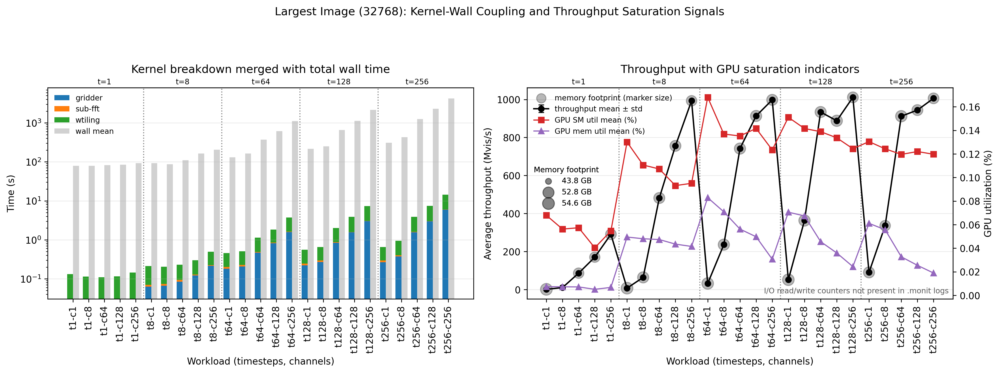

**Method**

Plot 19 again uses the largest-image subset of the `pasc25_16c` summary. Its left panel keeps the explicit sub-kernel decomposition from the raw `gridder:`, `sub-fft:`, and `wtiling:` lines together with the mean wall time. The right panel adds GPU monitoring data from the `.monit` files associated with the same runs: mean streaming-multiprocessor utilization, mean memory utilization, and a memory-footprint proxy across the full run. That footprint is computed from each `GPU_STATS:` JSON sample by summing `mem_used_MB` over all visible GPUs in the sample, taking the within-run peak of that summed value, averaging that peak across repeated runs for the same `(image size, t, c)`, converting to GiB with `/1024`, and then linearly mapping the resulting GiB values to marker areas for visualization. Because the utilization signals are full-run means, idle intervals and orchestration phases remain included in those averages.

**Caption (ready to use)**

Largest-image kernel-wall coupling with full-run GPU utilization signals. The left panel uses explicit IDG sub-kernel lines from the raw logs, while the right panel combines mean parsed throughput with full-run mean GPU SM utilization, full-run mean GPU memory utilization, and a memory-footprint marker-size encoding from the `.monit` telemetry.

**Interpretation**

This view is the correct one to cite when discussing whole-run behavior rather than device-active windows. The low full-run utilization values reflect not only the GPU kernels themselves but also the idle and orchestration periods surrounding them. That is why the right panel should be interpreted as an end-to-end utilization signature: it shows that throughput saturation appears even when the average GPU activity over the full run remains modest, which is consistent with substantial time being spent outside the explicitly logged IDG kernels.

---

## Plot 19b: Active-Window Utilization Saturation Signals

**File:** `scripts/plot19b_largest_image_kernel_wall_saturation_signals_active.png`

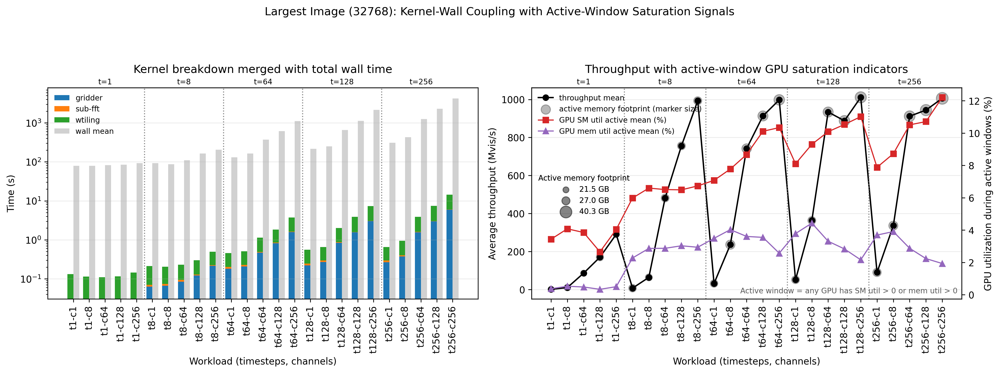

**Method**

Plot 19b uses the largest-image subset of the parsed `pasc25_16c` log summary and preserves the two-panel structure of Plot 19 for direct comparison. The left panel repeats the same stacked IDG kernel decomposition (`gridder`, `sub-fft`, `wtiling`) against the mean WSClean wall time, so any difference in interpretation comes only from the utilization treatment on the right. The right panel plots mean throughput for each `(t, c)` workload while the secondary axis reports GPU streaming-multiprocessor utilization and GPU memory-utilization means computed only over active windows, defined in the plotting code as intervals where any GPU reports `SM util > 0` or `mem util > 0`. The active-memory footprint is computed from the same `.monit` `GPU_STATS:` samples by summing `mem_used_MB` across visible GPUs for each active sample, averaging that summed value over the active samples within a run, averaging again across repeated runs for the same workload, converting from MiB-like monitor units to GiB with `/1024`, and then linearly rescaling the GiB values into marker areas. Group separators and top `t=` guides retain the ordering by timestep and channel count within the largest-image regime.

**Caption (ready to use)**

Plot 19b isolates active-window GPU behavior for the largest-image case while keeping the same left-panel kernel-versus-wall-time decomposition as Plot 19. The left panel shows that the summed IDG kernels remain small relative to total WSClean wall time across the `(t, c)` sweep. The right panel replots throughput against GPU streaming-multiprocessor utilization, GPU memory utilization, and active-memory footprint, but averages the GPU metrics only over intervals where the device is actually busy (`SM util > 0` or `mem util > 0`). This removes idle-window dilution and reveals how throughput saturates as compute-active utilization and active memory footprint increase.

**Interpretation**

This is the most useful variant for mechanism-focused discussion because it separates true device-active behavior from whole-run averages. For the largest image, throughput rises strongly with workload and then flattens near roughly `0.9-1.0` kMvis/s in the high-`t`, high-`c` cases, while active-window streaming-multiprocessor utilization increases only modestly to about `12%`. Active-window GPU memory utilization stays low, around `2-4%`, even as the active memory footprint grows from about `22` GiB in the smallest largest-image cases to about `41` GiB at `t256-c256`. Read together with the unchanged left panel, the figure shows that the throughput knee is not explained by wall-time domination of the plotted IDG kernels alone and is also not consistent with the GPU approaching full compute or memory saturation during its active phases. The main insight is therefore that larger workloads increase residency and pressure on the active working set while end-to-end throughput gains compress, which supports the broader paper argument that saturation emerges from orchestration and non-kernel costs around a GPU path that remains only partially utilized.

**Discussion**

From a hardware-software co-design perspective, the two panels point to different bottlenecks. Left panel: the plotted IDG kernels remain tiny compared with total WSClean wall time, with known-kernel time increasing from about `0.11 s` to `14.48 s` while wall time spans about `79 s` to `4204 s`, so more than `99.6%` of the end-to-end time sits outside the stacked kernels in this summary. That means software orchestration, host-side preparation, synchronization, I/O-adjacent work, or unprofiled phases dominate the exposed metric. Improving throughput here is therefore not mainly a matter of making `gridder` or `sub-fft` slightly faster in isolation; it requires reducing launch overheads, batching more work per dispatch, fusing host-side stages, minimizing CPU-GPU synchronization points, and exposing a larger fraction of the workflow to the accelerator. Right panel: once idle intervals are removed, throughput still saturates near `0.9-1.0` kMvis/s even though active-window streaming-multiprocessor utilization reaches only about `12%`, active memory utilization stays roughly in the `2-4%` range, and active memory footprint rises from about `22 GiB` to `41 GiB`. In co-design terms, this looks less like a raw hardware roofline limit and more like a pipeline-efficiency problem: the GPU is busy only moderately, memory residency grows with problem size, but the software does not feed enough regular work to drive the device toward high occupancy. Directions to improve the observed metrics therefore include increasing arithmetic intensity per launch, restructuring data layout to improve coalescing and reuse, reducing temporary-buffer traffic, overlapping transfers and preparation with execution, and redesigning the software pipeline so that larger `(t, c)` workloads create more useful continuous GPU work rather than mostly larger active working sets. The reason this happens is that the current decomposition suggests a mismatch between where total runtime accumulates and where the hardware is being measured: end-to-end slowdown is dominated by surrounding software phases, while the GPU active windows show only partial utilization and growing footprint rather than true saturation of compute or memory bandwidth.

---

## Plot 19d: Active-Window Utilization Saturation Signals Grouped by Channels

**File:** `scripts/plot19d_largest_image_kernel_wall_saturation_signals_active_by_c.png`

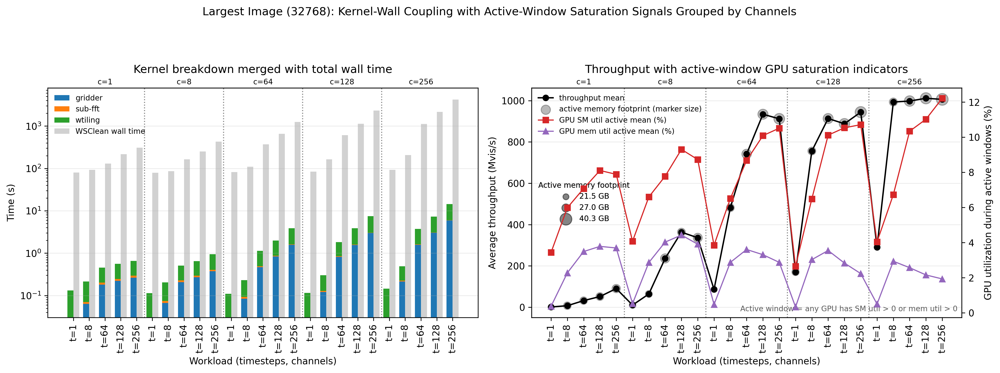

**Method**

This figure is a channel-grouped companion to Plot 19b and is generated from `scripts/kernel_breakdown_pasc25_16c_summary.csv`, which already contains the aggregated largest-image kernel, wall-time, throughput, and active-window GPU metrics extracted from the `pasc25_16c` logs and `.monit` files. The figure selects the largest image size in the summary table, then sorts workloads by `(channels, timesteps)` instead of `(timesteps, channels)`. In the left panel, the stacked bars show the summed explicit IDG sub-kernel times `gridder`, `sub-fft`, and `wtiling`, while the adjacent gray bar gives the corresponding end-to-end WSClean wall time. In the right panel, the black throughput curve uses the same average throughput metric as Plot 19b, the red and purple curves show active-window GPU SM and memory utilization, and the bubble size encodes active-window total GPU memory footprint in GiB. The active window is the interval in which any GPU has non-zero SM utilization or non-zero memory utilization. The main x-axis shows `t=...`, the top subgroup axis shows `c=...`, and dotted vertical separators mark channel-group boundaries. In the notebook interpretation, this workflow-level view is discussed together with a separate NVIDIA Nsight Compute support screenshot from `slurm-2671939_wsc_dirty_t0-7_c0-7_8192pix_20deg_8cores.ncu-rep`, which reports per-kernel compute-throughput and memory-throughput percentages for representative kernels.

**Caption (ready to use)**

Largest-image kernel-wall decomposition and active-window saturation signals, reordered by channel count `c` rather than timestep count `t`. The left panel shows explicit IDG sub-kernel times (`gridder`, `sub-fft`, `wtiling`) together with total WSClean wall time, while the right panel combines throughput with GPU utilization during active windows and active memory-footprint bubble size. This ordering makes spectral scaling effects directly visible within each channel group and can be interpreted together with supporting NVIDIA Nsight Compute evidence on representative kernel-level behavior.

**Interpretation**

The channel-grouped ordering makes the spectral-scaling trend much easier to read than the default timestep-grouped view. Within each `c` block, the stacked IDG kernel times remain small compared with the WSClean wall-time bar, which reinforces the same conclusion as Plot 19b: end-to-end runtime is dominated by work outside the explicitly logged IDG kernels. The right panel then shows that increasing timesteps within a fixed channel group raises throughput only modestly, while active-window SM utilization increases far less dramatically than the workload size and active memory footprint tends to grow. Taken together, this indicates that larger channel-rich workloads are not limited simply by insufficient raw GPU occupancy. Instead, the software stack appears to spend most of the total runtime outside the dominant IDG kernels, and the GPU active phase itself expands in memory footprint faster than it improves utilization or throughput.

This workflow-level picture is consistent with the NVIDIA Nsight Compute support figure you provided, even though that screenshot comes from a smaller representative workload (`slurm-2671939_wsc_dirty_t0-7_c0-7_8192pix_20deg_8cores.ncu-rep`) rather than from the exact largest-image case. In that Nsight view, several important kernels already show high per-kernel memory-throughput utilization: `kernel_gridder` is around `80%` memory throughput but only about `24-26%` compute throughput, `regular_fft` is around `80-86%` memory throughput with roughly `33-42%` compute throughput, `kernel_apply_phasor` is more balanced at roughly `64-67%` compute and `65-69%` memory throughput, and `kernel_subgrids_to_wtiles` is strongly compute-leaning at roughly `85-86%` compute throughput with about `54%` memory throughput. That support figure therefore suggests that the dominant GPU kernels are not uniformly weak in isolation; several of them already operate close to a memory-efficient regime, and some are compute-strong as well.

The connection to the present figure is that Plot 19d measures sustained workflow behavior, whereas Nsight measures what happens while individual kernels are actually running. The two views are therefore complementary: Nsight indicates that the kernels themselves can be reasonably efficient, while Plot 19d shows that the application does not sustain those efficient operating states across the full execution. The likely losses occur between or around kernels, through launch granularity, staging overhead, synchronization, host-device orchestration, and dataflow choices that grow the active working set faster than they improve end-to-end throughput. From a hardware-software co-design perspective, this points away from treating the problem as a pure single-kernel optimization issue and toward pipeline-level improvements: longer and better-batched channel groups, better overlap of host preparation and device work, fewer fragmented execution phases, and data-reuse strategies that keep the GPU in its more efficient kernel modes for a larger fraction of total runtime.

---

## Plot 19c: Active Metrics Faceted by Timesteps

**File:** `scripts/plot19c_largest_image_kernel_wall_saturation_signals_active_by_t.png`

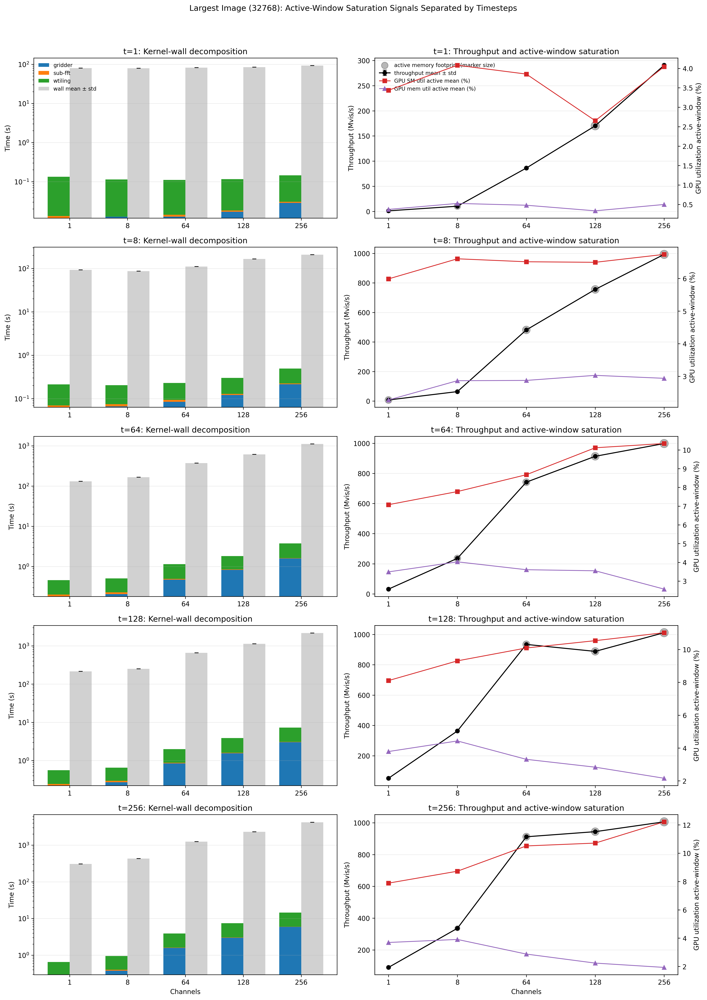

**Method**

Plot 19c uses the same largest-image `pasc25_16c` summary and the same explicit-IDG and active-window metrics as Plot 19b, but facets the figure by timestep. For each fixed `t`, the left facet shows the explicit sub-kernel bars plus wall-time bar, and the right facet shows throughput, active-window GPU utilization, and active memory footprint across channel counts only. The active memory footprint uses the same calculation as Plot 19b: sum `mem_used_MB` across GPUs for each active `.monit` sample, average over active samples within each run, average across repeated runs, convert to GiB with `/1024`, and linearly map the GiB values to marker areas. This removes cross-timestep visual mixing and isolates channel scaling within each timestep regime.

**Caption (ready to use)**

Facet-by-timestep variant of the active-window saturation diagnostics. Each row uses the largest-image `pasc25_16c` log summary, with explicit IDG sub-kernel decomposition on the left and throughput plus active-window GPU saturation signals on the right, so channel-scaling behavior can be compared separately at each timestep count.

**Interpretation**

Faceting clarifies whether the saturation pattern is a generic channel effect or whether it depends strongly on timestep count. The figure is useful when the paper needs to argue that the same mechanistic pattern recurs across timestep regimes rather than being driven by one particularly heavy configuration. It also makes it easier to see where active memory footprint keeps increasing even when throughput gains within a fixed-timestep family have already started to flatten.

---

## Plot 20: Active-Window Saturation Focus

**File:** `scripts/plot20_largest_image_active_window_saturation.png`

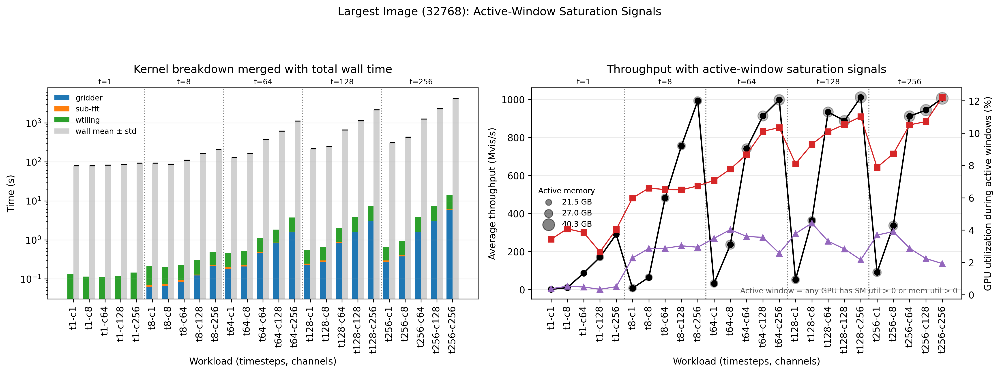

**Method**

Plot 20 is a publication-oriented merge of the same largest-image `pasc25_16c` ingredients used in Plot 19b. The left panel keeps the explicit sub-kernel decomposition from the raw `gridder:`, `sub-fft:`, and `wtiling:` lines, together with mean wall time. The right panel uses throughput means from the parsed gridding samples and active-window GPU telemetry from the `.monit` files, where an active window is any sample with non-zero SM or memory utilization. Marker size again encodes the active memory footprint, computed as the active-window average of the per-sample sum of `mem_used_MB` across GPUs, averaged across repeated runs, converted to GiB with `/1024`, and linearly rescaled to bubble area.

**Caption (ready to use)**

Merged largest-image view linking explicit IDG sub-kernel versus wall-time decomposition to active-window throughput and GPU saturation signals. The right panel uses active-window rather than full-run utilization averages, and marker size encodes active memory footprint.

**Interpretation**

This is the compact mechanism figure for the largest-image regime. It makes the two-level argument in one place: the explicit IDG kernels remain far smaller than total wall time, and the active-window GPU metrics show only partial device utilization even where throughput begins to plateau. The combined reading is that the observed saturation is not well explained by a single raw hardware limit, but by an interaction between modest device-side utilization and substantial surrounding software cost.

---

## Plot 21: Publication-Optimized Saturation View

**File:** `scripts/plot21_largest_image_readable_article_view.png`

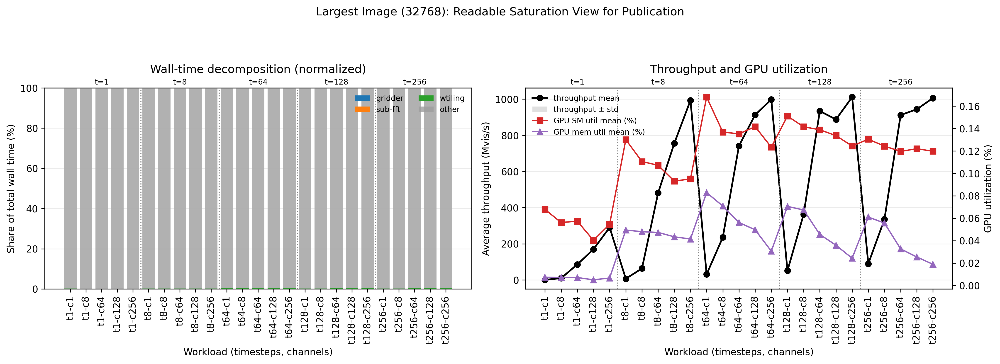

**Method**

Plot 21 uses the same largest-image `pasc25_16c` summary as Plots 18 to 20, but normalizes the left-panel timing decomposition by total wall time and removes the memory-footprint marker-size encoding from the right panel. The left panel therefore shows the percentage share of explicit `gridder:`, `sub-fft:`, `wtiling:`, and residual `other` time. The right panel keeps throughput plus full-run GPU SM and memory utilization means from the `.monit` data, with no bubble encoding.

**Caption (ready to use)**

Publication-optimized saturation view for the largest-image `pasc25_16c` workloads. Left: normalized wall-time decomposition into explicit IDG sub-kernels and residual `other` time. Right: mean throughput together with full-run GPU SM and memory utilization, presented without footprint bubbles for manuscript readability.

**Interpretation**

This figure is the clearest one to use when the main paper text needs a compact statement about where time goes. The normalized left panel emphasizes that the explicit IDG kernels are only a small share of total wall time across the workload sweep, while the right panel shows that throughput and utilization can be discussed without relying on the more technical footprint encoding. In coarser narrative terms, the figure says that the runtime burden is mostly not inside the explicitly logged kernels, and the mean GPU utilization remains moderate even as throughput approaches its plateau.

---

## Plot 22: Peak GPU Utilization Diagnostics

**File:** `scripts/plot22_largest_image_peak_gpu_utilization.png`

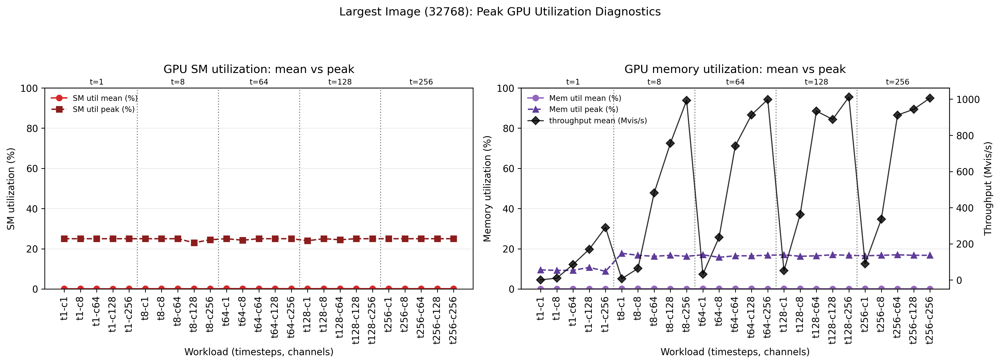

**Method**

Plot 22 uses the largest-image subset of the merged `pasc25_16c` kernel summary and `.monit` telemetry. It compares mean versus peak SM utilization on the left and mean versus peak memory utilization on the right, while overlaying throughput for context. The kernel parser itself still comes from the explicit sub-kernel lines used throughout Plots 17 to 21, but this figure focuses only on the utilization diagnostics extracted from the monitoring stream.

**Caption (ready to use)**

Peak-utilization diagnostic for the largest-image `pasc25_16c` workloads. Left: mean versus peak GPU SM utilization. Right: mean versus peak GPU memory utilization, with throughput overlaid for context. The goal is to distinguish sustained under-utilization from short-lived bursts.

**Interpretation**

The mean-versus-peak comparison is useful because a workload can have low average utilization while still experiencing high transient peaks. If the peaks are high but the means stay low, the limiting issue is unlikely to be a permanent hardware ceiling; it is more likely bursty execution, poor overlap, or a pipeline with uneven feeding of work to the GPU. That is the hardware-software interpretation this figure supports when read after the active-window views.

---

## Plot 23: Plot11 Mechanistic Explanation

**File:** `scripts/plot23_plot11_explanation_throughput_active_memory_util.png`

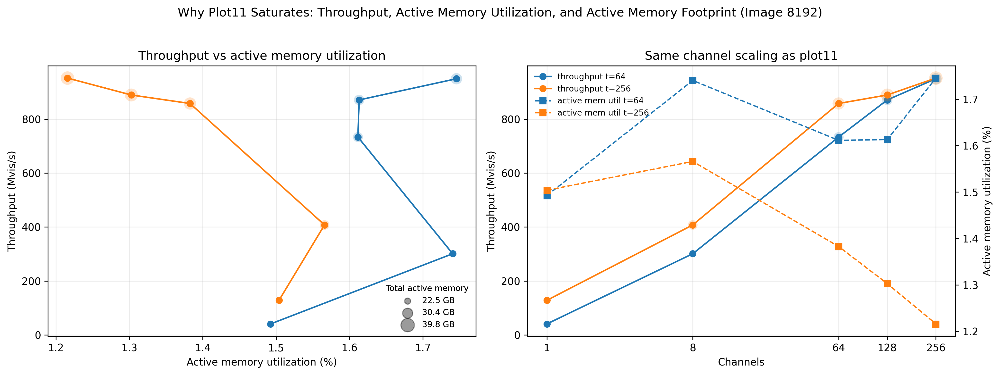

**Method**

Plot 23 reuses the same `pasc25_16c` parser and `.monit` merge as the larger-image saturation figures, but restricts the analysis to `image=8192` and `t in {64,256}` so it matches the workload family discussed in Plot 11. Throughput again comes from the parsed gridding samples in the raw logs, and active-window memory utilization plus active memory footprint come from the `.monit` telemetry. Here the active memory footprint is the active-window average of `sum(mem_used_MB over visible GPUs)` per sample, averaged over repeated runs and converted to GiB with `/1024`; those GiB values are then linearly mapped to bubble area. The left panel relates throughput directly to active memory utilization, while the right panel reorders the same points along the channel axis to match the stepwise saturation progression seen in Plot 11.

**Caption (ready to use)**

Mechanistic explanation figure for the Plot 11 saturation trend, using the same `pasc25_16c` raw-log and `.monit` sources but restricted to `image=8192` and `t in {64,256}`. The panels relate throughput to active memory utilization and active memory footprint, then re-express the same behavior along the channel axis used in Plot 11.

**Interpretation**

This figure explains the Plot 11 knee by showing that throughput does not keep rising in proportion to the growth of active working-set size. As channels increase, active memory footprint continues to grow, but throughput gains flatten and active memory utilization does not rise sharply enough to indicate simple bandwidth saturation. The software implication is that larger workloads are increasing residency and pressure on the active working set without turning that growth into equally effective GPU work.

---

## Plot 24: Saturation Knee Quantification for Plot9

**File:** `scripts/plot24_plot9_step_gain_knee_overlay.png`

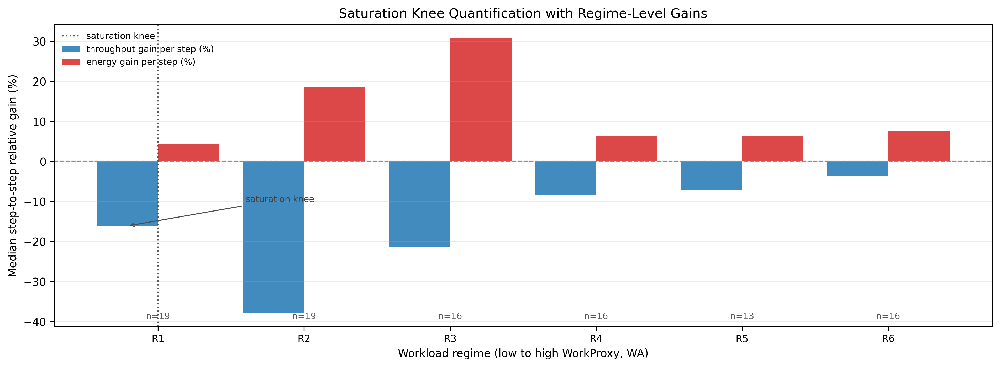

**Caption (ready to use)**

Regime-level comparison of median stepwise throughput gain versus energy gain, with annotated saturation knee where throughput gain falls behind energy growth.

**Interpretation**

This provides a quantitative knee criterion supporting the qualitative saturation seen in plot9. It is suitable for explicit discussion of diminishing returns.

---

## Plot 25: CPU Roofline and Scalability for WSClean Stacking

**File:** `scripts/plot25_cpu_roofline_stacking.png`

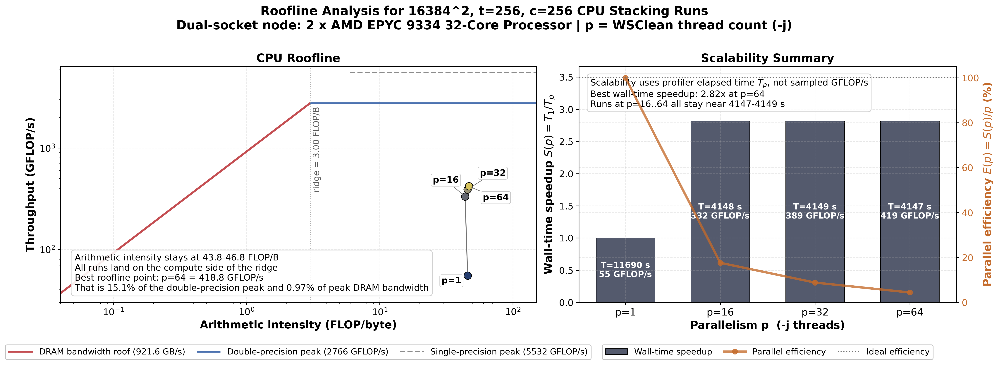

**Method**

AMD uProf `report.json` roofline exports were collected for the same WSClean CPU stacking workload (`16384^2`, `t=256`, `c=256`) at `p={1,16,32,64}` requested CPU cores from the sibling `astroCAMP-bench/roofline_stacking` dataset. The plotting script parses arithmetic intensity, achieved throughput, achieved memory bandwidth, elapsed profiling time, and machine ceilings (double-precision peak, single-precision peak, and DRAM bandwidth roof) from each export. A duplicate 1-core export with identical metrics is removed before analysis. The left subplot places the four runs on a standard roofline plane (arithmetic intensity versus throughput) using the AMD uProf ceilings. The right subplot reports standard strong-scaling metrics from elapsed time, using wall-time speedup `S(p)=T_1/T_p` and parallel efficiency `E(p)=S(p)/p`, while the point and bar annotations retain the achieved GFLOP/s values for context.

**Caption (ready to use)**

Roofline analysis for the WSClean CPU stacking workload (`16384^2`, `t=256`, `c=256`) across `p={1,16,32,64}` cores. Left: arithmetic intensity versus achieved throughput overlaid on AMD uProf machine ceilings for double-precision peak, single-precision peak, and DRAM bandwidth. All runs remain on the compute side of the ridge point. Right: standard wall-time scalability summary using elapsed profiler time, showing speedup `S(p)=T_1/T_p` and parallel efficiency `E(p)=S(p)/p` for the same runs.

**Interpretation**

The roofline panel shows that this workload is not limited by main-memory bandwidth: arithmetic intensity stays between about `43.8` and `46.8 FLOP/B`, well to the right of the ridge point at roughly `3.0 FLOP/B`, while measured memory bandwidth remains below `1%` of peak DRAM bandwidth. Throughput rises from `55.1` to `418.8 GFLOP/s` as core count increases, but the best run still reaches only `15.1%` of the double-precision peak, so the dominant limit is not the DRAM roof. The scalability panel sharpens that conclusion: elapsed time drops from `11689.7 s` at `p=1` to only about `4147-4149 s` for `p=16..64`, which corresponds to a wall-time speedup of just `2.82x` at `p=64` and a parallel efficiency of `4.4%`. In other words, adding cores increases sampled floating-point throughput, but it does not translate into proportional end-to-end speedup for this stacking workload.

---

## Plot 31: CPU Scaling Limits Behind Plot 25

**File:** `scripts/plot31_cpu_scaling_phase_limits.png`

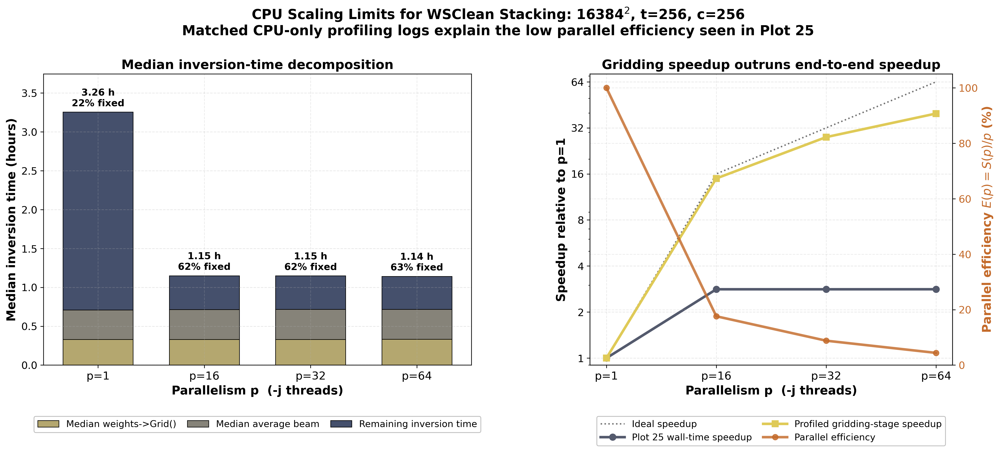

**Method**

This figure combines two matched sources for the same CPU-only WSClean stacking workload (`16384^2`, `t=256`, `c=256`) at `p={1,16,32,64}`. First, the script parses the repeated CPU-only `.out` logs from `astroCAMP-bench/profiling_cpu` and extracts the elapsed time of `weights->Grid()`, the elapsed time of the average-beam phase, and the reported total inversion time for each repeated run; the figure uses medians across the nine repetitions available per core count. Second, the script parses the matching `*_uprof_collect_inst.txt` files and takes the median of the AMD uProf `|host:` and `|gridding:` summaries across the 32 reported samples per run. These matched profiling medians are then merged with the standard wall-time speedup and parallel-efficiency values already used in Plot 25 from the AMD uProf roofline exports. The left subplot therefore shows a median inversion-time decomposition, while the right subplot compares Plot 25 end-to-end speedup against the profiled gridding-stage speedup and the ideal `S(p)=p` reference.

**Caption (ready to use)**

Matched CPU-only scaling analysis for the WSClean stacking workload (`16384^2`, `t=256`, `c=256`). Left: median inversion-time decomposition from repeated profiling logs, split into `weights->Grid()`, `average beam`, and the remaining inversion time. Right: comparison between the Plot 25 wall-time speedup `S(p)=T_1/T_p`, the profiled gridding-stage speedup from the `|host:` summaries, the ideal speedup line, and the corresponding parallel efficiency `E(p)=S(p)/p`. This figure is intended as a mechanism-oriented companion to Plot 25 rather than a replacement for the roofline.

**Interpretation**

The matched phase timings show that two substantial CPU-side phases barely change with core count: `weights->Grid()` stays near `1187-1198 s`, and the average-beam phase stays near `1368-1394 s` from `p=1` through `p=64`. As a result, these fixed-cost phases account for only about `22%` of inversion time at `p=1`, but already about `62-63%` of inversion time for `p=16..64`. The right panel shows the corresponding scaling gap: the profiled gridding stage speeds up from the `p=1` baseline by about `14.9x`, `27.8x`, and `39.7x` at `p=16`, `32`, and `64`, respectively, whereas the Plot 25 end-to-end wall-time speedup saturates at only about `2.82x`, with parallel efficiency dropping to `4.4%` at `p=64`. This does not directly measure spin time, but it strongly supports the interpretation that the low parallel efficiency in Plot 25 is correlated with non-scaling work outside the gridding kernel path and is therefore consistent with growing overhead, imbalance, and other serial or orchestration costs as core count increases.

---

## Plot 31b: Standalone CPU Scaling-Gap Figure

**File:** `scripts/plot31b_cpu_scaling_gap_only.png`

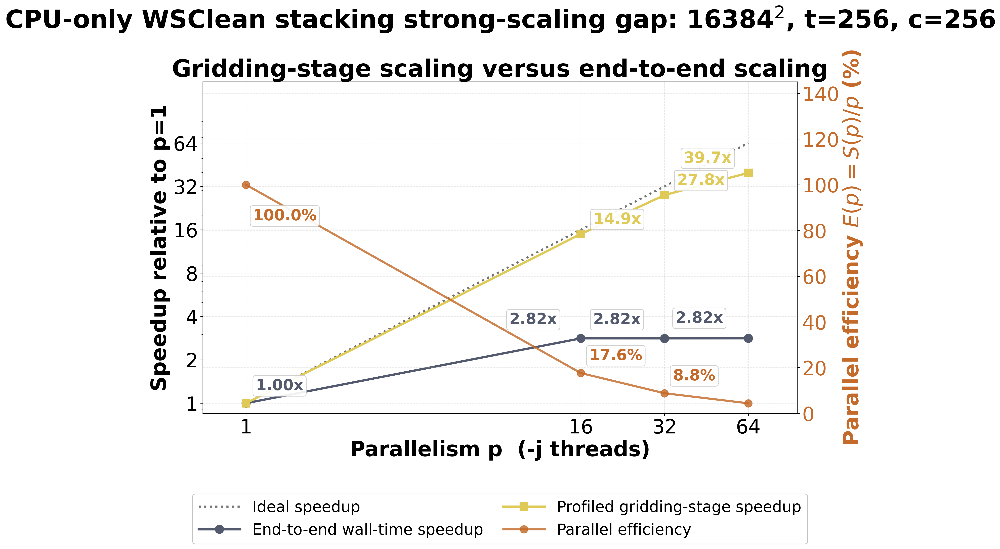

**Method**

This standalone figure reuses the matched CPU-only data assembled for Plot 31. The end-to-end wall-time speedup and parallel efficiency are taken from the same AMD uProf roofline elapsed times used in Plot 25 for the `16384^2`, `t=256`, `c=256` CPU stacking workload at `p={1,16,32,64}`. The profiled gridding-stage speedup is computed from the medians of the repeated `|host:` summaries in the matching `*_uprof_collect_inst.txt` logs from `astroCAMP-bench/profiling_cpu`, using the `p=1` median as the baseline. The resulting panel directly compares ideal scaling, profiled gridding-stage scaling, end-to-end wall-time scaling, and the corresponding parallel efficiency on the same horizontal axis.

**Caption (ready to use)**

Standalone strong-scaling comparison for the CPU-only WSClean stacking workload (`16384^2`, `t=256`, `c=256`). The figure contrasts ideal speedup, profiled gridding-stage speedup from the matched AMD uProf `|host:` summaries, end-to-end wall-time speedup from Plot 25, and the resulting parallel efficiency. It is intended for placement after the kernel-breakdown figure to show that good scaling inside the gridding path does not imply good scaling for the full inversion workflow.

**Interpretation**

As a standalone companion to the kernel-breakdown figure, this plot isolates the scaling mismatch clearly. The profiled gridding stage accelerates almost linearly up to about `39.7x` at `p=64`, while the end-to-end inversion speedup saturates near `2.82x` and the parallel efficiency falls to `4.4%`. The figure therefore makes the central point in one panel: the dominant scaling limit is not that the gridding kernel itself stops improving, but that the overall workflow becomes dominated by costs outside that well-scaling kernel path. For the paper, this is the cleanest single-panel figure to cite when arguing that the weak Plot 25 parallel efficiency is consistent with increasing overhead, imbalance, and non-scaling orchestration phases.

---

## Plot 32: Problem-Footprint Efficiency for IDG Execution Only

**File:** `scripts/plot32_problem_footprint_gib_per_joule.png`

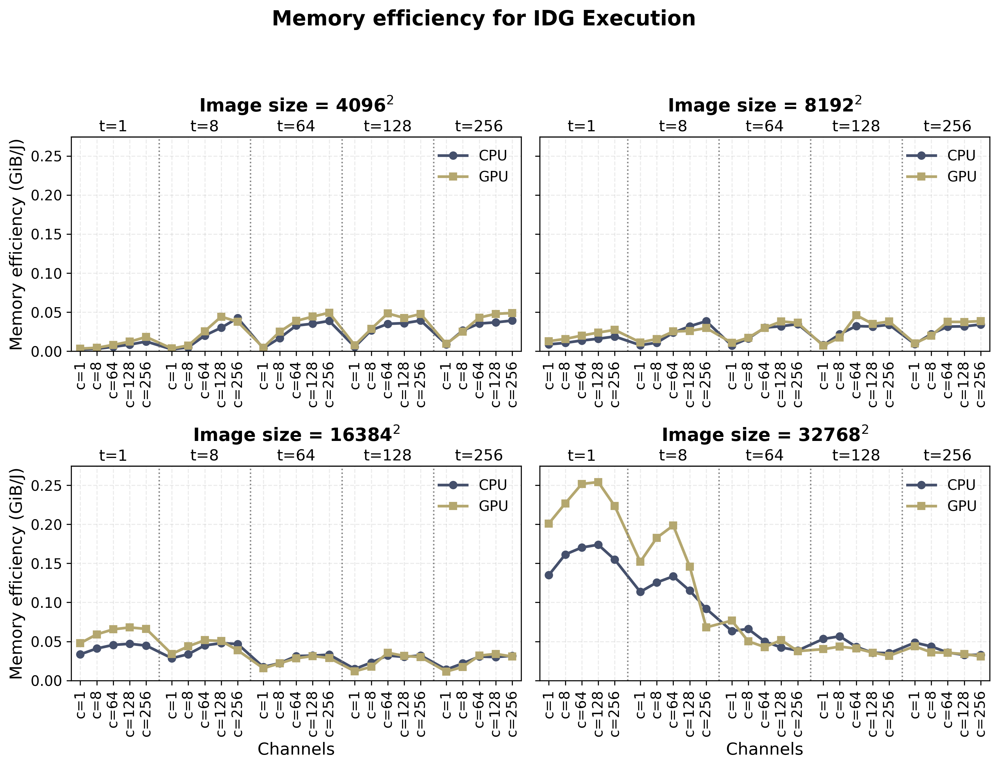

**Method**

Plot 32 uses the raw `pasc25_16c` logs together with the derived problem-size memory table. For each run, the script extracts direct Joules from the `|host:` and `|device:` summary lines in the log and sums them within the profiled IDG execution region. It then merges the corresponding `(image size, t, c)` row from `problem_size_memory_table.csv`, which provides the estimated input, output, and total problem footprint in GiB. That footprint is calculated as `input_on_disk_est_bytes = n_vis * 8 B`, `output_bytes = im_size^2 * 4 B`, and `total_gib = (input_on_disk_est_bytes + output_bytes) / 1024^3`. The plotted metric is therefore `total problem footprint / direct IDG host or device Joules`, aggregated as the median across repeated runs per workload.

**Caption (ready to use)**

Problem-footprint efficiency for IDG execution only, computed from direct `|host:` and `|device:` Joules in the raw `pasc25_16c` logs and the derived problem-size memory table. The figure reports how many GiB of total problem footprint correspond to one Joule of profiled host-side or device-side IDG energy for each workload.

**Interpretation**

This figure should be interpreted as a footprint-normalized energy measure rather than a true memory-traffic metric. It does not measure DRAM transfers or disk I/O directly; instead, it asks how much total problem state is associated with each Joule spent inside the profiled IDG region. That makes it useful for comparing workloads at a coarse systems level, especially when the paper wants an energy-normalized notion of scale. The host-versus-device split also shows whether the problem footprint grows more favorably with host-side or GPU-side IDG energy as workloads become larger.

---

## Plot 32b: IDG Data-Movement Efficiency from Raw Log Summaries

**File:** `scripts/plot32b_idg_data_movement_gb_per_joule.png`

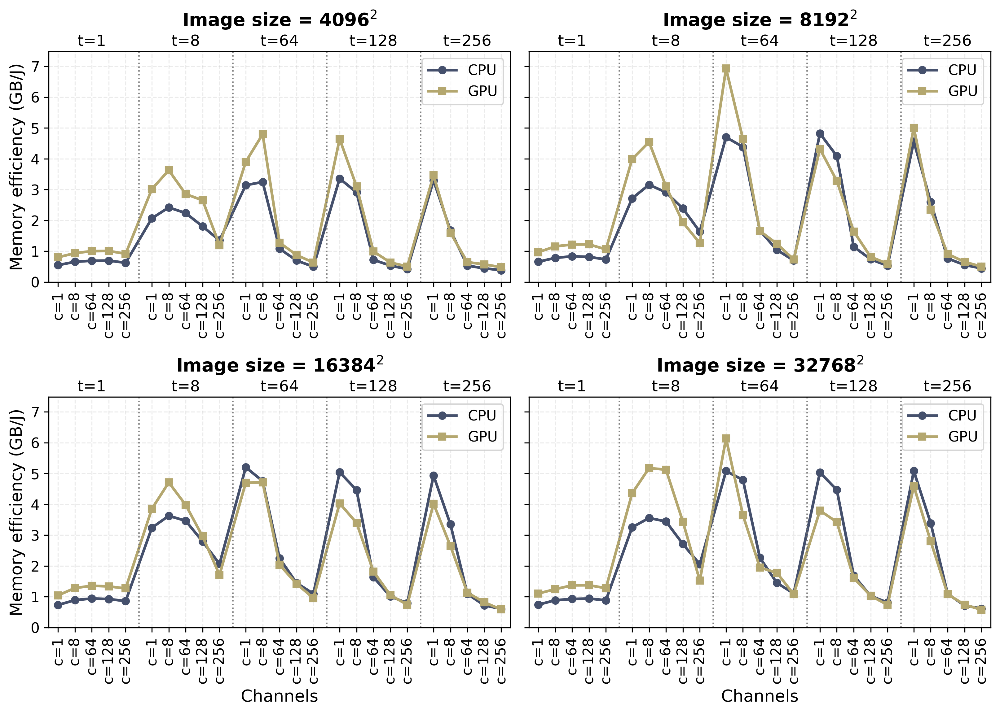

**Method**

Plot 32b uses the same `pasc25_16c` raw logs but a different extraction rule from Plots 17 to 23. Instead of the explicit sub-kernel lines, it uses the leading-`|` summary records: `|host:` and `|device:` provide direct Joules, while `|gridder:` and `|sub-fft:` provide summary seconds and GB/s. The script reconstructs stage-level transferred gigabytes as `GB/s * seconds`, sums `|gridder| + |sub-fft|`, and divides that total by the corresponding host or device Joules. The resulting metric is therefore a log-summary-based IDG data-movement efficiency in `GB/J`, not an end-to-end WSClean or exact hardware-counter memory metric.

**Caption (ready to use)**

IDG data-movement efficiency derived from the raw `pasc25_16c` `|...` summary lines. The figure combines `|gridder:` and `|sub-fft:` summary bandwidth-time products to estimate transferred gigabytes, then normalizes by direct `|host:` or `|device:` Joules from the same IDG execution region, yielding a `GB/J` measure for host-side and device-side IDG execution.

**Interpretation**

This plot is more direct than Plot 32 because it is based on the log-reported stage summaries rather than on the total problem footprint. Its interpretation must therefore stay close to the raw log semantics: it is a summary-line estimate of IDG data movement per Joule, not a ground-truth DRAM or disk-traffic efficiency. Within that scope, it is useful for comparing how efficiently host-side and device-side IDG execution convert summarized stage data movement into energy across workloads. It should be discussed with an explicit caveat that, unlike Plots 17 to 23, it depends on the leading-`|` summary records rather than the explicit per-stage sub-metric lines.

---

## Plot 34b: Input and Output Problem Sizes for 8k$^2$ and 32k$^2$ Workloads

**File:** `scripts/plot34b_large_problem_size_stacked_linear.png`

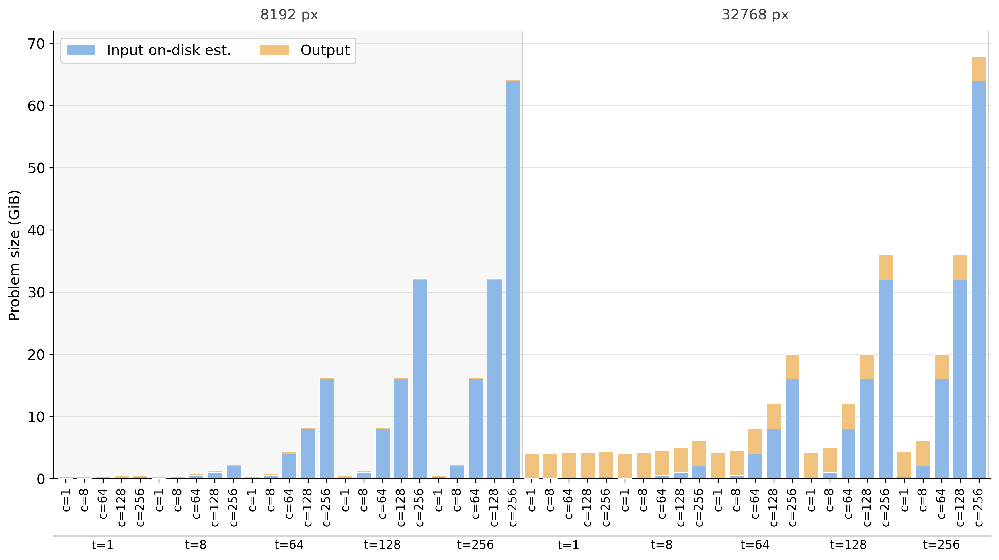

**Method**

This figure is built from `scripts/problem_size_memory_table.csv`, which is derived from `benchmarks.csv` by enumerating unique `(Image size, Timesteps, Channels)` workloads and converting them into analytical payload sizes. The table is filtered to the `8192^2` and `32768^2` image-size classes and sorted by `(Image size, Timesteps, Channels)`. For each workload, the lower stacked bar segment is the estimated input on-disk payload, computed as `n_vis x 8 B`, assuming one complex single-precision visibility value per visibility in the `_single.ms` inputs. The upper segment is the estimated output payload, computed as `ImageSize^2 x 4 B`, corresponding to one single-precision Stokes-I image plane. The total bar height is therefore `Input + Output` in GiB. The main x-axis shows `c=...`, the secondary x-axis shows `t=...`, and the image-size groups are marked across the top.

**Caption (ready to use)**

Stacked analytical input and output payload sizes for the `8192^2` and `32768^2` imaging workloads as a function of timesteps `t` and channels `c`. The lower segment gives the estimated input payload (`n_vis x 8 B`), while the upper segment gives the estimated output image size (`ImageSize^2 x 4 B`). The total height therefore represents the analytical problem footprint transferred into and out of the IDG imaging stage for each workload configuration.

**Interpretation**

The figure isolates the `8192^2` and `32768^2` cases as a readable cross-section of a broader trend that is present across all image sizes in the full workload table. For every image size, increasing `t` and `c` causes the input side to grow much faster than the output side because the output is tied only to the image plane while the input scales with total visibility count. The two image sizes shown here make that progression easy to see at both a moderate and an extreme scale: at `8192^2`, the output still matters visually for small workloads, whereas at `32768^2` the fixed `4 GiB` output is quickly overtaken by the expanding input. The same qualitative behavior holds across the omitted image sizes as well; the fixed output term is exactly 0.0625 GiB for `4096^2` and 1.0 GiB for `16384^2`, compared with 0.25 GiB for `8192^2` and 4.0 GiB for `32768^2`. From a software perspective, this means that larger workloads become increasingly dominated by visibility ingestion, staging, and reuse rather than by image write-back. From a hardware perspective, it motivates comparing footprint growth with energy-normalized movement metrics, because the system burden across all image sizes is driven primarily by the expanding input stream.

---

## Plot 34c: Problem Size and IDG Data-Movement Efficiency Grouped by Timesteps

**File:** `scripts/plot34c_large_problem_size_with_gbj.png`

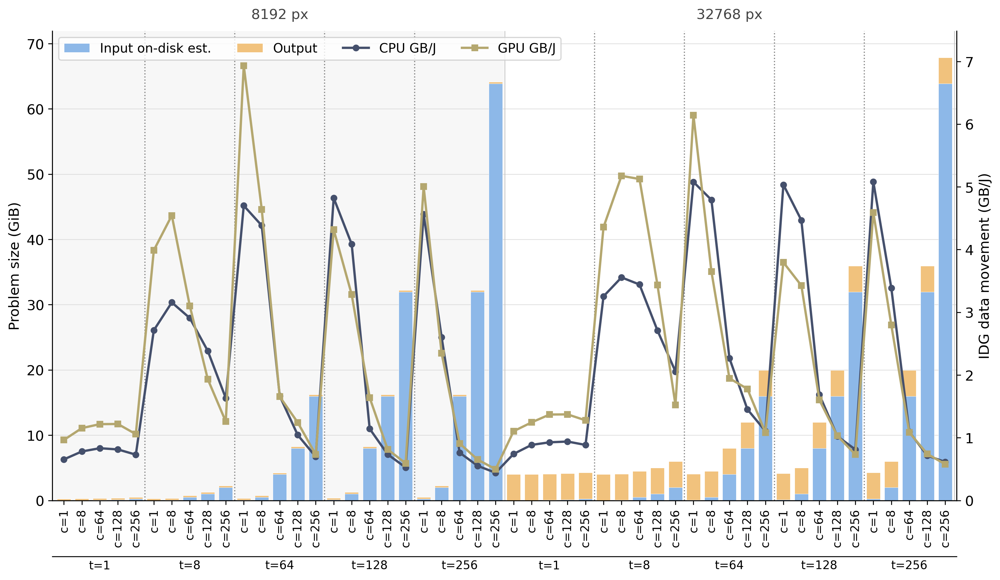

**Method**

This figure merges the analytical problem-size table with the direct IDG `GB/J` summary. The stacked bars come from `scripts/problem_size_memory_table.csv`, filtered to `8192^2` and `32768^2`. As in Plot 34b, the lower segment is the estimated input payload `n_vis x 8 B`, the upper segment is the estimated output payload `ImageSize^2 x 4 B`, and the left y-axis reports the result in GiB. The overlaid right-axis curves come from `scripts/plot32b_idg_data_movement_gb_per_joule_summary.csv`, which is generated from the raw `pasc25_16c` logs. In that pipeline, direct host and device joules are parsed from the `|host:` and `|device:` summary lines, while transferred gigabytes are reconstructed from the `|gridder:` and `|sub-fft:` summary records using `GB moved = GB/s x seconds`; host and device efficiencies are then `total stage GB / host joules` and `total stage GB / device joules`. The two datasets are joined on the common workload key `(Image size, Timesteps, Channels)`. The main x-axis shows `c=...`, the secondary bottom axis shows `t=...`, and dotted separators mark timestep-group boundaries within each image-size section.

**Caption (ready to use)**

Merged view of analytical problem size and IDG data-movement efficiency for the `8192^2` and `32768^2` workloads. Stacked bars show the estimated input and output payload sizes on the left y-axis, while the right y-axis shows host-side and device-side IDG data-movement efficiency in `GB/J`, computed from raw log-derived stage bytes and profiled joules. Within each image-size group, workloads are ordered by timesteps `t` and channels `c`.

**Interpretation**

This figure places workload footprint growth next to the energy efficiency of the IDG execution for the `8192^2` and `32768^2` slice, but the underlying trend is not unique to those two image sizes. Across the full workload set, the analytical footprint always increases mainly through the input side as `t` and `c` grow, while the output contribution remains fixed for a given image size. The subset shown here simply makes that general pattern readable at two widely separated scales. The `GB/J` curves then show whether larger staged data movement is processed efficiently per joule. In practice, the device curve tends to sit above the host curve, indicating that the GPU-side IDG path moves more staged data per joule than the host-side path for the same workload. At the same time, efficiency does not rise in proportion to the total footprint: more data is moved overall, but not proportionally more data per joule. That interpretation is consistent with the broader all-size trend as well. From a hardware-software co-design perspective, the message is therefore general: simply scaling the problem size does not guarantee better movement efficiency. Better overlap, fewer redundant passes over the visibility stream, and a software schedule that preserves high-throughput kernels as the dominant work are required if larger footprints across the full workload range are to improve `GB/J` rather than merely increase traffic.

---

## Plot 34d: Problem Size and IDG Data-Movement Efficiency Grouped by Channels

**File:** `scripts/plot34d_large_problem_size_with_gbj_by_c.png`

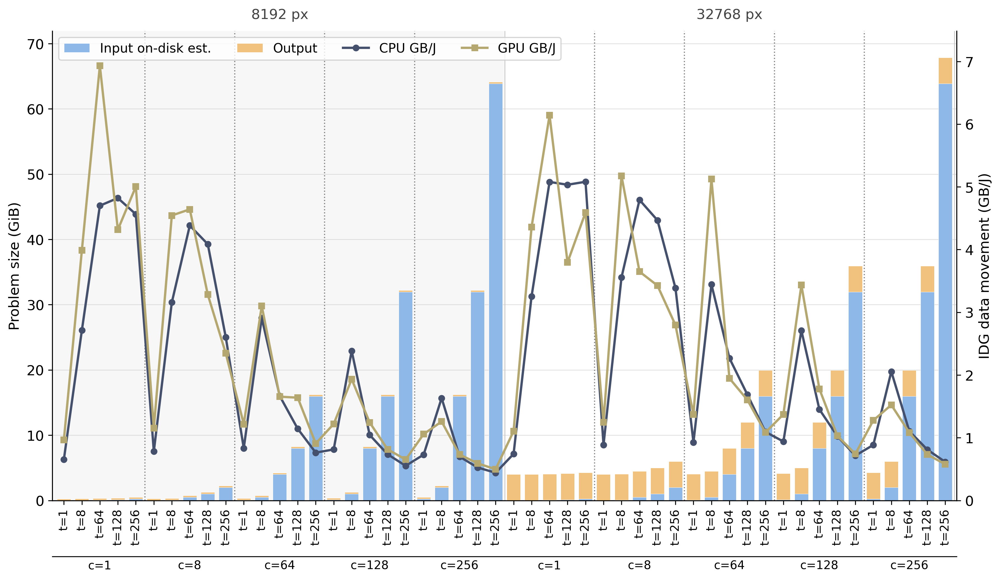

**Method**

This figure uses the same merged datasets as Plot 34c, but changes the sort and grouping order to emphasize spectral rather than temporal scaling. The problem-size table from `scripts/problem_size_memory_table.csv` is filtered to `8192^2` and `32768^2` and sorted by `(Image size, Channels, Timesteps)`. The left-axis stacked bars again show analytical input and output payload sizes in GiB. The right-axis host and device `GB/J` curves again come from `scripts/plot32b_idg_data_movement_gb_per_joule_summary.csv`, where stage bytes are reconstructed from the `|gridder:` and `|sub-fft:` summary lines and divided by direct `|host:` and `|device:` joules. The main x-axis shows `t=...`, the secondary bottom axis shows `c=...`, and dotted separators mark channel-group boundaries within each image-size section.

**Caption (ready to use)**

Alternative merged view of analytical problem size and IDG data-movement efficiency for the `8192^2` and `32768^2` workloads, grouped by channels `c` instead of timesteps `t`. Stacked bars report the estimated input and output payload sizes on the left y-axis, while host-side and device-side `GB/J` are overlaid on the right y-axis from raw log-derived stage bytes and profiled joules.

**Interpretation**

Grouping by channels makes the spectral-scaling behavior especially visible for the `8192^2` and `32768^2` slice, but the same relationship appears across the full set of image sizes. For all image sizes, visibility count grows linearly with channels, so the input bar expands rapidly as `c` increases while the output contribution stays fixed for a given image size. The two displayed image sizes therefore act as a compact representative sample of a broader cross-size trend rather than as exceptional cases. The overlaid `GB/J` curves show whether the implementation converts that larger spectral data stream into efficient staged movement. The key result is that the gain in energy-normalized movement is much smaller than the gain in analytical footprint. That same mismatch is the important systems-level trend across all image sizes: channel growth immediately increases the data stream, but the software-hardware stack does not convert that increase into proportionally better `GB/J`. For co-design, this points toward channel-oriented partitioning, better batching or fusion across channel groups, and lower host-side orchestration overhead as more promising directions than simply provisioning more memory capacity.

---

## Plot 34e: Single-Column Problem Size and IDG Memory Efficiency Grouped by Channels

**File:** `scripts/plot34e_large_problem_size_with_gbj_by_c_single_column.png`

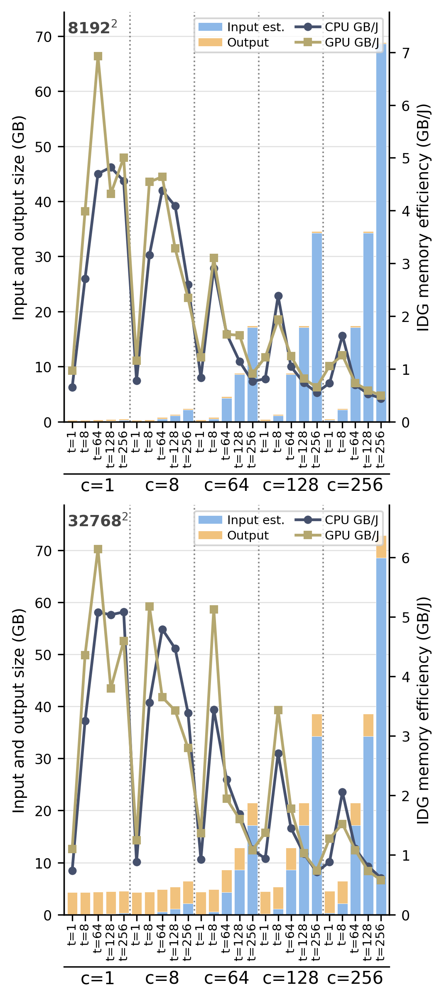

**Method**

This figure is a single-column variant of Plot 34d. It uses the same merged inputs, namely `scripts/problem_size_memory_table.csv` for the analytical problem-size estimates and `scripts/plot32b_idg_data_movement_gb_per_joule_summary.csv` for host-side and device-side IDG `GB/J`. The workload set is filtered to the `8192^2` and `32768^2` image sizes and sorted by `(Image size, Channels, Timesteps)`. To preserve readability in a single-column layout, the two image sizes are split into vertically stacked subplots instead of being shown in one wide panel. In each subplot, the left axis shows stacked analytical input and output sizes converted from GiB to decimal `GB`, where `input = n_vis x 8 B` and `output = ImageSize^2 x 4 B`. The right axis overlays host-side and device-side IDG memory-efficiency curves taken directly from the raw-log-derived `host_gb_per_j` and `device_gb_per_j` columns. Within each image-size panel, the main x-axis shows `t=...`, the secondary x-axis shows `c=...`, and dotted separators mark channel-group boundaries.

**Caption (ready to use)**

Single-column view of analytical problem size and IDG memory efficiency for the `8192^2` and `32768^2` workloads, grouped by channels `c`. Each subplot corresponds to one image size. Stacked bars report the analytical input and output sizes on the left y-axis in decimal `GB`, while the right y-axis shows host-side and device-side IDG memory efficiency in `GB/J` from raw log-derived stage bytes and profiled joules. The layout preserves the channel-grouped comparison of Plot 34d while remaining readable in a paper single column.

**Interpretation**

This figure keeps the same channel-grouped comparison as Plot 34d but presents it in a form that is more suitable for a single-column paper layout. The two stacked panels make it easier to compare the `8192^2` and `32768^2` cases without compressing the `t=` and `c=` labels beyond readability. The dominant systems-level pattern remains the same: for both image sizes, increasing channels primarily expands the input side of the problem, while the output term remains fixed for a given image size. The left axis therefore makes clear that the footprint pressure is driven mainly by the visibility stream rather than by the image write-back. The right axis then shows that larger spectral workloads do not automatically deliver proportionally higher IDG memory efficiency. The GPU-side curve generally remains above the host-side curve, indicating better energy-normalized staged movement on the device path, but neither curve rises in proportion to the growth of the analytical footprint. This is the key co-design message: scaling channels increases the amount of data that must be staged and processed, yet the host-device software stack does not convert that larger data stream into equally strong gains in `GB/J`. The likely improvement directions are therefore not just larger memory capacity, but better batching across channel groups, fewer redundant passes over the visibility data, lower orchestration overhead, and software scheduling that keeps the efficient GPU stages dominant over a larger fraction of the execution.

---

## Additional Export

The consolidated flagship PDF is available at `scripts/flagship_energy_throughput_facets_paper.pdf`.

In [ ]:
entries = [{'file': 'scripts/plot1_walltime_vs_workproxy.png', 'title': 'Plot 1: Wall Time vs Work Proxy', 'caption': 'Wall time scales with workload proxy (ImageSize$^2$×Timesteps×Channels) on log-log axes. The slope indicates non-linear cost growth as workload increases, and differences between curves indicate location-dependent runtime characteristics.', 'article': 'This figure establishes the baseline scalability trend: runtime increases strongly with computational demand. The location split quantifies infrastructure effects and motivates downstream decomposition into throughput, energy, and utilization metrics.'}, {'file': 'scripts/plot2_throughput_vs_workproxy.png', 'title': 'Plot 2: Throughput vs Work Proxy', 'caption': 'Throughput (Mvis/h) as a function of workload proxy shows an initial increase followed by flattening, consistent with resource saturation at larger scales.', 'article': 'The observed plateau indicates that additional workload no longer translates into proportional throughput gains. This is the first direct evidence of diminishing returns, later explained using kernel timing and active-window utilization analyses.'}, {'file': 'scripts/plot3_energy_vs_workproxy.png', 'title': 'Plot 3: Energy vs Work Proxy', 'caption': 'Total energy consumption rises with workload proxy on log-log axes, with location-specific offsets reflecting platform and energy-mix differences.', 'article': 'Unlike throughput, energy continues to grow even in saturation regimes. This divergence underpins the efficiency gap: energy scales with runtime burden while useful work growth weakens.'}, {'file': 'scripts/plot4_static_fraction_vs_workproxy.png', 'title': 'Plot 4: Static Energy Fraction vs Work Proxy', 'caption': 'Static-to-total energy fraction across workload scale. Larger static fractions indicate weaker energy proportionality.', 'article': 'As scale increases, persistent static overhead contributes more strongly to total energy in several regimes. This helps explain why total energy can keep rising despite throughput plateaus.'}, {'file': 'scripts/plot5_mvis_per_kwh_vs_workproxy.png', 'title': 'Plot 5: Energy Efficiency vs Work Proxy', 'caption': 'Energy efficiency (Mvis/kWh) over workload proxy highlights where scaling remains cost-effective versus where efficiency saturates or declines.', 'article': 'Efficiency behavior summarizes the interaction between throughput gain and energy growth. Regions with flat or dropping Mvis/kWh correspond to the onset of practical saturation.'}, {'file': 'scripts/plot6_energy_time_scatter.png', 'title': 'Plot 6: Energy-Time Tradeoff', 'caption': 'Energy-time scatter (log-log), with marker size proportional to throughput. The figure reveals Pareto-like tradeoffs between speed and energy cost.', 'article': 'Points that move up-right represent jointly higher runtime and energy, while larger markers indicate productivity. The cloud structure helps identify regimes where faster execution no longer improves efficiency proportionally.'}, {'file': 'scripts/plot7_power_vs_throughput.png', 'title': 'Plot 7: Power vs Throughput', 'caption': 'Average power versus throughput indicates whether higher performance is driven by better utilization or by higher instantaneous power draw.', 'article': 'The trend separates power-limited from utilization-limited behavior. If throughput saturates while power remains high, overall energy efficiency deteriorates.'}, {'file': 'scripts/plot8_mvis_per_kgco2_vs_workproxy.png', 'title': 'Plot 8: Carbon Efficiency vs Work Proxy', 'caption': 'Carbon efficiency (Mvis/kgCO2) across workload scale. Curves capture the combined effects of runtime, energy draw, and carbon intensity.', 'article': 'Carbon-aware performance does not necessarily match pure throughput trends. This figure supports sustainability-aware operating point selection under saturation.'}, {'file': 'scripts/plot9_flagship_energy_stack_throughput_facets.png', 'title': 'Plot 9: Flagship Faceted Energy and Throughput View', 'caption': 'Faceted stacked energy breakdown (dynamic + static) with throughput overlay, grouped by timestep and channel combinations. Dotted separators and top `t=` guides indicate workload grouping.', 'article': 'This flagship figure exposes the key phenomenon of the study: throughput growth weakens while total energy keeps increasing across larger configurations. Group separation by timestep clarifies that saturation appears systematically rather than as a single outlier.'}, {'file': 'scripts/plot10_carbon_cost_efficiency_facets.png', 'title': 'Plot 10: Carbon and Cost Breakdown with Efficiency Overlays', 'caption': 'Largest-image comparison of carbon and cost components with efficiency overlays, enabling simultaneous analysis of environmental and economic tradeoffs.', 'article': 'The figure links decomposition (operational vs embodied/capital) with delivered work per impact unit. It supports multi-objective decisions beyond raw runtime.'}, {'file': 'scripts/plot11_idg_gpu_saturation_overhead_from_logs_t64.png', 'title': 'Plot 11 (t=64): Saturation and Overhead from Parsed Logs', 'caption': 'For fixed t=64, per-call gridding throughput, wall-time growth, and gridder share indicate where overhead dominates beyond kernel-level gains.', 'article': 'This panel isolates a low-timestep regime and shows that end-to-end behavior is not fully explained by kernel throughput alone. Non-gridder components increasingly shape runtime.'}, {'file': 'scripts/plot11_idg_gpu_saturation_overhead_from_logs_t256.png', 'title': 'Plot 11 (t=256): Saturation and Overhead from Parsed Logs', 'caption': 'For fixed t=256, scaling exhibits stronger wall-time expansion relative to gridder-only gains, consistent with system-level bottlenecks at larger work units.', 'article': 'Compared to t=64, the higher timestep regime emphasizes persistent overhead and reinforces the saturation narrative under heavier workloads.'}, {'file': 'scripts/plot11_idg_gpu_saturation_overhead_from_logs.png', 'title': 'Plot 11 (Legacy Combined Variant)', 'caption': 'Legacy combined version of parsed-log saturation diagnostics. Kept for completeness and backward comparison.', 'article': 'This figure is useful for tracing analysis evolution, but timestep-separated versions are preferred for publication clarity.'}, {'file': 'scripts/plot12_idg_gpu_sanity_checks_from_logs.png', 'title': 'Plot 12: Parsed-Log Sanity Checks', 'caption': 'Consistency checks across wall time, summed kernel time, parsed call counts, and variability metrics validate parser fidelity and metric interpretability.', 'article': 'These diagnostics establish trust in subsequent mechanistic plots by showing coherent internal relationships in the raw log-derived quantities.'}, {'file': 'scripts/plot13_idg_gpu_gridder_wall_ratio_focus.png', 'title': 'Plot 13: Gridder-to-Wall Ratio Focus', 'caption': 'Gridder fraction of wall time across timesteps/channels, including heatmap summary, highlights when non-gridder overhead dominates.', 'article': 'The ratio perspective quantifies why kernel-level speedups alone cannot explain end-to-end scaling behavior in high-load regimes.'}, {'file': 'scripts/plot14_cpu_vs_gpu_walltime_from_bench.png', 'title': 'Plot 14: CPU vs GPU End-to-End Comparison', 'caption': 'Matched-workload wall-time and effective-throughput comparison between CPU-only and GPU modes across thread counts.', 'article': 'This figure benchmarks accelerator benefit in full pipeline context, separating algorithmic speedup from runtime orchestration effects.'}, {'file': 'scripts/plot15_explain_plot9_saturation.png', 'title': 'Plot 15: Dedicated Explanation of Plot9 Saturation', 'caption': 'Throughput plateau and static-burden relationship for WA workloads, showing that larger runs incur increasing fixed-cost share.', 'article': 'This is the bridge figure from descriptive behavior to mechanism: static overhead and longer runtime jointly limit throughput improvements.'}, {'file': 'scripts/plot16_idg_gpu_raw_log_explainer.png', 'title': 'Plot 16: Mechanistic Raw-Log Explainer', 'caption': 'Three-view diagnostic combining throughput plateau, runtime decomposition, and efficiency-power trend from parsed kernel logs.', 'article': 'By combining kernel and system-level views, this figure explains why local kernel efficiency metrics do not fully map to end-to-end throughput.'}, {'file': 'scripts/plot17_kernel_time_breakdown_pasc25_16c.png', 'title': 'Plot 17: Kernel Breakdown Across Image/Timesteps/Channels', 'method': 'Plot 17 is built from all matching raw logs in `astroCAMP-bench/pasc25_16c`. The parser explicitly sums only the sub-kernel log lines that start with `gridder:`, `sub-fft:`, and `wtiling:` for each run, and takes elapsed wall time from the `Elapsed ...` line. It does not use the `|gridder:` or other leading-`|` summary records for the stacked kernel bars. The figure groups runs by image size, timesteps, and channels, then plots the median summed sub-kernel times together with the full WSClean wall time on a log scale.', 'caption': 'Kernel-time composition versus total WSClean wall time across the full `(image size, t, c)` workload grid, using explicit summed IDG sub-kernel log lines (`gridder:`, `sub-fft:`, `wtiling:`) rather than the `|...` summary records. The log scale shows that the parsed IDG kernel contribution remains far below end-to-end wall time, while image-size effects are much clearer in summed sub-kernel time than in the total runtime.', 'interpretation': 'This global view shows that image size is not the dominant driver of end-to-end wall time in this regime, even though it still increases the explicit IDG sub-kernel time. For matched timestep and channel counts, wall time often changes only weakly across image sizes, while the summed sub-kernel bars grow more systematically. The key implication is that most total runtime accumulates outside the explicitly logged IDG sub-kernels, so image-size effects are visually compressed in the end-to-end metric. That is why the later largest-image figures are needed: they focus on the regime where non-kernel costs, utilization behavior, and throughput saturation can be discussed more directly.'}, {'file': 'scripts/plot17b_kernel_time_breakdown_with_disk.png', 'title': 'Plot 17b: Kernel Breakdown with Disk Footprint Overlay', 'method': 'Plot 17b uses the same `pasc25_16c` raw-log parser as Plot 17, so the stacked bars again come only from the explicit `gridder:`, `sub-fft:`, and `wtiling:` sub-kernel lines plus the elapsed wall-time line. It then merges each `(image size, t, c)` configuration with the locally generated `problem_size_memory_table.csv` and overlays the estimated input-plus-output disk footprint on a secondary axis. That footprint is computed as `input_on_disk_est_bytes = n_vis * 8 B` for one complex FP32 visibility payload, `output_bytes = im_size^2 * 4 B` for one FP32 Stokes-I image plane, and `total_disk_gib = (input_on_disk_est_bytes + output_bytes) / 1024^3`. The overlay therefore does not come from the raw logs; it comes from the derived problem-size table that maps the same workload coordinates to estimated on-disk input and output sizes.', 'caption': 'Variant of Plot 17 that keeps the explicit-IDG sub-kernel versus wall-time decomposition from the raw `pasc25_16c` logs and adds a secondary-axis line for the estimated total disk footprint (`input + output`) of each workload. The stacked bars still use only the explicit sub-kernel lines, while the right-axis overlay summarizes problem-size growth in storage terms.', 'interpretation': 'The added disk-footprint line makes clear that larger workloads do not just change runtime; they also increase the amount of input and output state associated with the problem. However, the main timing conclusion remains unchanged from Plot 17: the explicit IDG sub-kernel contribution stays small relative to total WSClean wall time. The overlay is useful because it separates two different notions of scale, namely computational kernel time and problem-state size on disk. Read together, the figure shows that larger problem footprints do not map directly to proportional wall-time growth, again pointing to surrounding software and orchestration costs as the dominant end-to-end factor.'}, {'file': 'scripts/plot18_largest_image_kernel_wall_throughput.png', 'title': 'Plot 18: Largest-Image Detailed View', 'method': 'Plot 18 filters the `pasc25_16c` summary to the largest image only and preserves the same explicit sub-kernel parsing used in Plot 17: `gridder:`, `sub-fft:`, and `wtiling:` are summed from the raw logs, while wall time comes from the elapsed-time line. The left panel plots the median kernel-time composition per `(t, c)` workload. The right panel pairs the mean WSClean wall time with the mean parsed gridding throughput samples from the same logs, retaining the timestep subgroup guides for readability.', 'caption': 'Largest-image detailed view for the `pasc25_16c` logs. Left: median explicit IDG sub-kernel composition from the raw `gridder:`, `sub-fft:`, and `wtiling:` lines. Right: mean total WSClean wall time and mean parsed gridding throughput for the same `(t, c)` workloads, with subgroup guides indicating timestep structure.', 'interpretation': 'Restricting the figure to the largest image removes image-size variation and makes the workload ordering clearer. The explicit IDG sub-kernels still remain much smaller than total wall time, so the figure reinforces the same structural gap seen in Plot 17, but now in the regime most relevant to the paper narrative. The throughput panel shows that increasing workload intensity does raise delivered work rate, yet the wall-time scale remains much larger, which is the first indication that kernel-level gains and end-to-end runtime are not moving together.'}, {'file': 'scripts/plot19_largest_image_kernel_wall_saturation_signals.png', 'title': 'Plot 19: Full-Run Utilization Saturation Signals', 'method': 'Plot 19 again uses the largest-image subset of the `pasc25_16c` summary. Its left panel keeps the explicit sub-kernel decomposition from the raw `gridder:`, `sub-fft:`, and `wtiling:` lines together with the mean wall time. The right panel adds GPU monitoring data from the `.monit` files associated with the same runs: mean streaming-multiprocessor utilization, mean memory utilization, and a memory-footprint proxy across the full run. That footprint is computed from each `GPU_STATS:` JSON sample by summing `mem_used_MB` over all visible GPUs in the sample, taking the within-run peak of that summed value, averaging that peak across repeated runs for the same `(image size, t, c)`, converting to GiB with `/1024`, and then linearly mapping the resulting GiB values to marker areas for visualization. Because the utilization signals are full-run means, idle intervals and orchestration phases remain included in those averages.', 'caption': 'Largest-image kernel-wall coupling with full-run GPU utilization signals. The left panel uses explicit IDG sub-kernel lines from the raw logs, while the right panel combines mean parsed throughput with full-run mean GPU SM utilization, full-run mean GPU memory utilization, and a memory-footprint marker-size encoding from the `.monit` telemetry.', 'interpretation': 'This view is the correct one to cite when discussing whole-run behavior rather than device-active windows. The low full-run utilization values reflect not only the GPU kernels themselves but also the idle and orchestration periods surrounding them. That is why the right panel should be interpreted as an end-to-end utilization signature: it shows that throughput saturation appears even when the average GPU activity over the full run remains modest, which is consistent with substantial time being spent outside the explicitly logged IDG kernels.'}, {'file': 'scripts/plot19b_largest_image_kernel_wall_saturation_signals_active.png', 'title': 'Plot 19b: Active-Window Utilization Saturation Signals', 'method': 'Plot 19b uses the largest-image subset of the parsed `pasc25_16c` log summary and preserves the two-panel structure of Plot 19 for direct comparison. The left panel repeats the same stacked IDG kernel decomposition (`gridder`, `sub-fft`, `wtiling`) against the mean WSClean wall time, so any difference in interpretation comes only from the utilization treatment on the right. The right panel plots mean throughput for each `(t, c)` workload while the secondary axis reports GPU streaming-multiprocessor utilization and GPU memory-utilization means computed only over active windows, defined in the plotting code as intervals where any GPU reports `SM util > 0` or `mem util > 0`. The active-memory footprint is computed from the same `.monit` `GPU_STATS:` samples by summing `mem_used_MB` across visible GPUs for each active sample, averaging that summed value over the active samples within a run, averaging again across repeated runs for the same workload, converting from MiB-like monitor units to GiB with `/1024`, and then linearly rescaling the GiB values into marker areas. Group separators and top `t=` guides retain the ordering by timestep and channel count within the largest-image regime.', 'caption': 'Plot 19b isolates active-window GPU behavior for the largest-image case while keeping the same left-panel kernel-versus-wall-time decomposition as Plot 19. The left panel shows that the summed IDG kernels remain small relative to total WSClean wall time across the `(t, c)` sweep. The right panel replots throughput against GPU streaming-multiprocessor utilization, GPU memory utilization, and active-memory footprint, but averages the GPU metrics only over intervals where the device is actually busy (`SM util > 0` or `mem util > 0`). This removes idle-window dilution and reveals how throughput saturates as compute-active utilization and active memory footprint increase.', 'interpretation': 'This is the most useful variant for mechanism-focused discussion because it separates true device-active behavior from whole-run averages. For the largest image, throughput rises strongly with workload and then flattens near roughly `0.9-1.0` kMvis/s in the high-`t`, high-`c` cases, while active-window streaming-multiprocessor utilization increases only modestly to about `12%`. Active-window GPU memory utilization stays low, around `2-4%`, even as the active memory footprint grows from about `22` GiB in the smallest largest-image cases to about `41` GiB at `t256-c256`. Read together with the unchanged left panel, the figure shows that the throughput knee is not explained by wall-time domination of the plotted IDG kernels alone and is also not consistent with the GPU approaching full compute or memory saturation during its active phases. The main insight is therefore that larger workloads increase residency and pressure on the active working set while end-to-end throughput gains compress, which supports the broader paper argument that saturation emerges from orchestration and non-kernel costs around a GPU path that remains only partially utilized.', 'discussion': 'From a hardware-software co-design perspective, the two panels point to different bottlenecks. Left panel: the plotted IDG kernels remain tiny compared with total WSClean wall time, with known-kernel time increasing from about `0.11 s` to `14.48 s` while wall time spans about `79 s` to `4204 s`, so more than `99.6%` of the end-to-end time sits outside the stacked kernels in this summary. That means software orchestration, host-side preparation, synchronization, I/O-adjacent work, or unprofiled phases dominate the exposed metric. Improving throughput here is therefore not mainly a matter of making `gridder` or `sub-fft` slightly faster in isolation; it requires reducing launch overheads, batching more work per dispatch, fusing host-side stages, minimizing CPU-GPU synchronization points, and exposing a larger fraction of the workflow to the accelerator. Right panel: once idle intervals are removed, throughput still saturates near `0.9-1.0` kMvis/s even though active-window streaming-multiprocessor utilization reaches only about `12%`, active memory utilization stays roughly in the `2-4%` range, and active memory footprint rises from about `22 GiB` to `41 GiB`. In co-design terms, this looks less like a raw hardware roofline limit and more like a pipeline-efficiency problem: the GPU is busy only moderately, memory residency grows with problem size, but the software does not feed enough regular work to drive the device toward high occupancy. Directions to improve the observed metrics therefore include increasing arithmetic intensity per launch, restructuring data layout to improve coalescing and reuse, reducing temporary-buffer traffic, overlapping transfers and preparation with execution, and redesigning the software pipeline so that larger `(t, c)` workloads create more useful continuous GPU work rather than mostly larger active working sets. The reason this happens is that the current decomposition suggests a mismatch between where total runtime accumulates and where the hardware is being measured: end-to-end slowdown is dominated by surrounding software phases, while the GPU active windows show only partial utilization and growing footprint rather than true saturation of compute or memory bandwidth.'}, {'file': 'scripts/plot19e_largest_image_kernel_wall_saturation_signals_active_by_c.png', 'title': 'Plot 19e: Active-Window Utilization Saturation Signals Grouped by Channels', 'method': 'This figure is a channel-grouped companion to Plot 19b and is generated from `scripts/kernel_breakdown_pasc25_16c_summary.csv`, which already contains the aggregated largest-image kernel, wall-time, throughput, and active-window GPU metrics extracted from the `pasc25_16c` logs and `.monit` files. The figure selects the largest image size in the summary table, then sorts workloads by `(channels, timesteps)` instead of `(timesteps, channels)`. In the left panel, the stacked bars show the summed explicit IDG sub-kernel times `gridder`, `sub-fft`, and `wtiling`, while the adjacent gray bar gives the corresponding end-to-end WSClean wall time. In the right panel, the black throughput curve uses the same average throughput metric as Plot 19b, the red and purple curves show active-window GPU SM and memory utilization, and the bubble size encodes active-window total GPU memory footprint in GiB. The active window is the interval in which any GPU has non-zero SM utilization or non-zero memory utilization. The main x-axis shows `t=...`, the top subgroup axis shows `c=...`, and dotted vertical separators mark channel-group boundaries. In the notebook interpretation, this workflow-level view is discussed together with a separate NVIDIA Nsight Compute support screenshot from `slurm-2671939_wsc_dirty_t0-7_c0-7_8192pix_20deg_8cores.ncu-rep`, which reports per-kernel compute-throughput and memory-throughput percentages for representative kernels.', 'caption': 'Largest-image saturation signals grouped by channels $c$. Left: summed explicit IDG sub-kernel times (gridder, sub-FFT, w-tiling) versus end-to-end WSClean wall time for each $(t,c)$ workload. Right: throughput with active-window GPU utilization and memory-footprint statistics (averaged only over samples with active GPU work).', 'interpretation': 'The channel-grouped ordering makes the spectral-scaling trend much easier to read than the default timestep-grouped view. Within each `c` block, the stacked IDG kernel times remain small compared with the WSClean wall-time bar, which reinforces the same conclusion as Plot 19b: end-to-end runtime is dominated by work outside the explicitly logged IDG kernels. The right panel then shows that increasing timesteps within a fixed channel group raises throughput only modestly, while active-window SM utilization increases far less dramatically than the workload size and active memory footprint tends to grow. Taken together, this indicates that larger channel-rich workloads are not limited simply by insufficient raw GPU occupancy. Instead, the software stack appears to spend most of the total runtime outside the dominant IDG kernels, and the GPU active phase itself expands in memory footprint faster than it improves utilization or throughput.\n\nThis workflow-level picture is consistent with the NVIDIA Nsight Compute support figure you provided, even though that screenshot comes from a smaller representative workload (`slurm-2671939_wsc_dirty_t0-7_c0-7_8192pix_20deg_8cores.ncu-rep`) rather than from the exact largest-image case. In that Nsight view, several important kernels already show high per-kernel memory-throughput utilization: `kernel_gridder` is around `80%` memory throughput but only about `24-26%` compute throughput, `regular_fft` is around `80-86%` memory throughput with roughly `33-42%` compute throughput, `kernel_apply_phasor` is more balanced at roughly `64-67%` compute and `65-69%` memory throughput, and `kernel_subgrids_to_wtiles` is strongly compute-leaning at roughly `85-86%` compute throughput with about `54%` memory throughput. That support figure therefore suggests that the dominant GPU kernels are not uniformly weak in isolation; several of them already operate close to a memory-efficient regime, and some are compute-strong as well.\n\nThe connection to the present figure is that Plot 19d measures sustained workflow behavior, whereas Nsight measures what happens while individual kernels are actually running. The two views are therefore complementary: Nsight indicates that the kernels themselves can be reasonably efficient, while Plot 19d shows that the application does not sustain those efficient operating states across the full execution. The likely losses occur between or around kernels, through launch granularity, staging overhead, synchronization, host-device orchestration, and dataflow choices that grow the active working set faster than they improve end-to-end throughput. From a hardware-software co-design perspective, this points away from treating the problem as a pure single-kernel optimization issue and toward pipeline-level improvements: longer and better-batched channel groups, better overlap of host preparation and device work, fewer fragmented execution phases, and data-reuse strategies that keep the GPU in its more efficient kernel modes for a larger fraction of total runtime.'}, {'file': 'scripts/plot19c_largest_image_kernel_wall_saturation_signals_active_by_t.png', 'title': 'Plot 19c: Active Metrics Faceted by Timesteps', 'method': 'Plot 19c uses the same largest-image `pasc25_16c` summary and the same explicit-IDG and active-window metrics as Plot 19b, but facets the figure by timestep. For each fixed `t`, the left facet shows the explicit sub-kernel bars plus wall-time bar, and the right facet shows throughput, active-window GPU utilization, and active memory footprint across channel counts only. The active memory footprint uses the same calculation as Plot 19b: sum `mem_used_MB` across GPUs for each active `.monit` sample, average over active samples within each run, average across repeated runs, convert to GiB with `/1024`, and linearly map the GiB values to marker areas. This removes cross-timestep visual mixing and isolates channel scaling within each timestep regime.', 'caption': 'Facet-by-timestep variant of the active-window saturation diagnostics. Each row uses the largest-image `pasc25_16c` log summary, with explicit IDG sub-kernel decomposition on the left and throughput plus active-window GPU saturation signals on the right, so channel-scaling behavior can be compared separately at each timestep count.', 'interpretation': 'Faceting clarifies whether the saturation pattern is a generic channel effect or whether it depends strongly on timestep count. The figure is useful when the paper needs to argue that the same mechanistic pattern recurs across timestep regimes rather than being driven by one particularly heavy configuration. It also makes it easier to see where active memory footprint keeps increasing even when throughput gains within a fixed-timestep family have already started to flatten.'}, {'file': 'scripts/plot20_largest_image_active_window_saturation.png', 'title': 'Plot 20: Active-Window Saturation Focus', 'method': 'Plot 20 is a publication-oriented merge of the same largest-image `pasc25_16c` ingredients used in Plot 19b. The left panel keeps the explicit sub-kernel decomposition from the raw `gridder:`, `sub-fft:`, and `wtiling:` lines, together with mean wall time. The right panel uses throughput means from the parsed gridding samples and active-window GPU telemetry from the `.monit` files, where an active window is any sample with non-zero SM or memory utilization. Marker size again encodes the active memory footprint, computed as the active-window average of the per-sample sum of `mem_used_MB` across GPUs, averaged across repeated runs, converted to GiB with `/1024`, and linearly rescaled to bubble area.', 'caption': 'Merged largest-image view linking explicit IDG sub-kernel versus wall-time decomposition to active-window throughput and GPU saturation signals. The right panel uses active-window rather than full-run utilization averages, and marker size encodes active memory footprint.', 'interpretation': 'This is the compact mechanism figure for the largest-image regime. It makes the two-level argument in one place: the explicit IDG kernels remain far smaller than total wall time, and the active-window GPU metrics show only partial device utilization even where throughput begins to plateau. The combined reading is that the observed saturation is not well explained by a single raw hardware limit, but by an interaction between modest device-side utilization and substantial surrounding software cost.'}, {'file': 'scripts/plot21_largest_image_readable_article_view.png', 'title': 'Plot 21: Publication-Optimized Saturation View', 'method': 'Plot 21 uses the same largest-image `pasc25_16c` summary as Plots 18 to 20, but normalizes the left-panel timing decomposition by total wall time and removes the memory-footprint marker-size encoding from the right panel. The left panel therefore shows the percentage share of explicit `gridder:`, `sub-fft:`, `wtiling:`, and residual `other` time. The right panel keeps throughput plus full-run GPU SM and memory utilization means from the `.monit` data, with no bubble encoding.', 'caption': 'Publication-optimized saturation view for the largest-image `pasc25_16c` workloads. Left: normalized wall-time decomposition into explicit IDG sub-kernels and residual `other` time. Right: mean throughput together with full-run GPU SM and memory utilization, presented without footprint bubbles for manuscript readability.', 'interpretation': 'This figure is the clearest one to use when the main paper text needs a compact statement about where time goes. The normalized left panel emphasizes that the explicit IDG kernels are only a small share of total wall time across the workload sweep, while the right panel shows that throughput and utilization can be discussed without relying on the more technical footprint encoding. In coarser narrative terms, the figure says that the runtime burden is mostly not inside the explicitly logged kernels, and the mean GPU utilization remains moderate even as throughput approaches its plateau.'}, {'file': 'scripts/plot22_largest_image_peak_gpu_utilization.png', 'title': 'Plot 22: Peak GPU Utilization Diagnostics', 'method': 'Plot 22 uses the largest-image subset of the merged `pasc25_16c` kernel summary and `.monit` telemetry. It compares mean versus peak SM utilization on the left and mean versus peak memory utilization on the right, while overlaying throughput for context. The kernel parser itself still comes from the explicit sub-kernel lines used throughout Plots 17 to 21, but this figure focuses only on the utilization diagnostics extracted from the monitoring stream.', 'caption': 'Peak-utilization diagnostic for the largest-image `pasc25_16c` workloads. Left: mean versus peak GPU SM utilization. Right: mean versus peak GPU memory utilization, with throughput overlaid for context. The goal is to distinguish sustained under-utilization from short-lived bursts.', 'interpretation': 'The mean-versus-peak comparison is useful because a workload can have low average utilization while still experiencing high transient peaks. If the peaks are high but the means stay low, the limiting issue is unlikely to be a permanent hardware ceiling; it is more likely bursty execution, poor overlap, or a pipeline with uneven feeding of work to the GPU. That is the hardware-software interpretation this figure supports when read after the active-window views.'}, {'file': 'scripts/plot23_plot11_explanation_throughput_active_memory_util.png', 'title': 'Plot 23: Plot11 Mechanistic Explanation', 'method': 'Plot 23 reuses the same `pasc25_16c` parser and `.monit` merge as the larger-image saturation figures, but restricts the analysis to `image=8192` and `t in {64,256}` so it matches the workload family discussed in Plot 11. Throughput again comes from the parsed gridding samples in the raw logs, and active-window memory utilization plus active memory footprint come from the `.monit` telemetry. Here the active memory footprint is the active-window average of `sum(mem_used_MB over visible GPUs)` per sample, averaged over repeated runs and converted to GiB with `/1024`; those GiB values are then linearly mapped to bubble area. The left panel relates throughput directly to active memory utilization, while the right panel reorders the same points along the channel axis to match the stepwise saturation progression seen in Plot 11.', 'caption': 'Mechanistic explanation figure for the Plot 11 saturation trend, using the same `pasc25_16c` raw-log and `.monit` sources but restricted to `image=8192` and `t in {64,256}`. The panels relate throughput to active memory utilization and active memory footprint, then re-express the same behavior along the channel axis used in Plot 11.', 'interpretation': 'This figure explains the Plot 11 knee by showing that throughput does not keep rising in proportion to the growth of active working-set size. As channels increase, active memory footprint continues to grow, but throughput gains flatten and active memory utilization does not rise sharply enough to indicate simple bandwidth saturation. The software implication is that larger workloads are increasing residency and pressure on the active working set without turning that growth into equally effective GPU work.'}, {'file': 'scripts/plot24_plot9_step_gain_knee_overlay.png', 'title': 'Plot 24: Saturation Knee Quantification for Plot9', 'caption': 'Regime-level comparison of median stepwise throughput gain versus energy gain, with annotated saturation knee where throughput gain falls behind energy growth.', 'article': 'This provides a quantitative knee criterion supporting the qualitative saturation seen in plot9. It is suitable for explicit discussion of diminishing returns.'}, {'file': 'scripts/plot25_cpu_roofline_stacking.png', 'title': 'Plot 25: CPU Roofline and Scalability for WSClean Stacking', 'method': 'AMD uProf `report.json` roofline exports were collected for the same WSClean CPU stacking workload (`16384^2`, `t=256`, `c=256`) at `p={1,16,32,64}` requested CPU cores from the sibling `astroCAMP-bench/roofline_stacking` dataset. The plotting script parses arithmetic intensity, achieved throughput, achieved memory bandwidth, elapsed profiling time, and machine ceilings (double-precision peak, single-precision peak, and DRAM bandwidth roof) from each export. A duplicate 1-core export with identical metrics is removed before analysis. The left subplot places the four runs on a standard roofline plane (arithmetic intensity versus throughput) using the AMD uProf ceilings. The right subplot reports standard strong-scaling metrics from elapsed time, using wall-time speedup `S(p)=T_1/T_p` and parallel efficiency `E(p)=S(p)/p`, while the point and bar annotations retain the achieved GFLOP/s values for context.', 'caption': 'Roofline analysis for the WSClean CPU stacking workload (`16384^2`, `t=256`, `c=256`) across `p={1,16,32,64}` cores. Left: arithmetic intensity versus achieved throughput overlaid on AMD uProf machine ceilings for double-precision peak, single-precision peak, and DRAM bandwidth. All runs remain on the compute side of the ridge point. Right: standard wall-time scalability summary using elapsed profiler time, showing speedup `S(p)=T_1/T_p` and parallel efficiency `E(p)=S(p)/p` for the same runs.', 'interpretation': 'The roofline panel shows that this workload is not limited by main-memory bandwidth: arithmetic intensity stays between about `43.8` and `46.8 FLOP/B`, well to the right of the ridge point at roughly `3.0 FLOP/B`, while measured memory bandwidth remains below `1%` of peak DRAM bandwidth. Throughput rises from `55.1` to `418.8 GFLOP/s` as core count increases, but the best run still reaches only `15.1%` of the double-precision peak, so the dominant limit is not the DRAM roof. The scalability panel sharpens that conclusion: elapsed time drops from `11689.7 s` at `p=1` to only about `4147-4149 s` for `p=16..64`, which corresponds to a wall-time speedup of just `2.82x` at `p=64` and a parallel efficiency of `4.4%`. In other words, adding cores increases sampled floating-point throughput, but it does not translate into proportional end-to-end speedup for this stacking workload.'}, {'file': 'scripts/plot31_cpu_scaling_phase_limits.png', 'title': 'Plot 31: CPU Scaling Limits Behind Plot 25', 'method': 'This figure combines two matched sources for the same CPU-only WSClean stacking workload (`16384^2`, `t=256`, `c=256`) at `p={1,16,32,64}`. First, the script parses the repeated CPU-only `.out` logs from `astroCAMP-bench/profiling_cpu` and extracts the elapsed time of `weights->Grid()`, the elapsed time of the average-beam phase, and the reported total inversion time for each repeated run; the figure uses medians across the nine repetitions available per core count. Second, the script parses the matching `*_uprof_collect_inst.txt` files and takes the median of the AMD uProf `|host:` and `|gridding:` summaries across the 32 reported samples per run. These matched profiling medians are then merged with the standard wall-time speedup and parallel-efficiency values already used in Plot 25 from the AMD uProf roofline exports. The left subplot therefore shows a median inversion-time decomposition, while the right subplot compares Plot 25 end-to-end speedup against the profiled gridding-stage speedup and the ideal `S(p)=p` reference.', 'caption': 'Matched CPU-only scaling analysis for the WSClean stacking workload (`16384^2`, `t=256`, `c=256`). Left: median inversion-time decomposition from repeated profiling logs, split into `weights->Grid()`, `average beam`, and the remaining inversion time. Right: comparison between the Plot 25 wall-time speedup `S(p)=T_1/T_p`, the profiled gridding-stage speedup from the `|host:` summaries, the ideal speedup line, and the corresponding parallel efficiency `E(p)=S(p)/p`. This figure is intended as a mechanism-oriented companion to Plot 25 rather than a replacement for the roofline.', 'interpretation': 'The matched phase timings show that two substantial CPU-side phases barely change with core count: `weights->Grid()` stays near `1187-1198 s`, and the average-beam phase stays near `1368-1394 s` from `p=1` through `p=64`. As a result, these fixed-cost phases account for only about `22%` of inversion time at `p=1`, but already about `62-63%` of inversion time for `p=16..64`. The right panel shows the corresponding scaling gap: the profiled gridding stage speeds up from the `p=1` baseline by about `14.9x`, `27.8x`, and `39.7x` at `p=16`, `32`, and `64`, respectively, whereas the Plot 25 end-to-end wall-time speedup saturates at only about `2.82x`, with parallel efficiency dropping to `4.4%` at `p=64`. This does not directly measure spin time, but it strongly supports the interpretation that the low parallel efficiency in Plot 25 is correlated with non-scaling work outside the gridding kernel path and is therefore consistent with growing overhead, imbalance, and other serial or orchestration costs as core count increases.'}, {'file': 'scripts/plot31b_cpu_scaling_gap_only.png', 'title': 'Plot 31b: Standalone CPU Scaling-Gap Figure', 'method': 'This standalone figure reuses the matched CPU-only data assembled for Plot 31. The end-to-end wall-time speedup and parallel efficiency are taken from the same AMD uProf roofline elapsed times used in Plot 25 for the `16384^2`, `t=256`, `c=256` CPU stacking workload at `p={1,16,32,64}`. The profiled gridding-stage speedup is computed from the medians of the repeated `|host:` summaries in the matching `*_uprof_collect_inst.txt` logs from `astroCAMP-bench/profiling_cpu`, using the `p=1` median as the baseline. The resulting panel directly compares ideal scaling, profiled gridding-stage scaling, end-to-end wall-time scaling, and the corresponding parallel efficiency on the same horizontal axis.', 'caption': 'Standalone strong-scaling comparison for the CPU-only WSClean stacking workload (`16384^2`, `t=256`, `c=256`). The figure contrasts ideal speedup, profiled gridding-stage speedup from the matched AMD uProf `|host:` summaries, end-to-end wall-time speedup from Plot 25, and the resulting parallel efficiency. It is intended for placement after the kernel-breakdown figure to show that good scaling inside the gridding path does not imply good scaling for the full inversion workflow.', 'interpretation': 'As a standalone companion to the kernel-breakdown figure, this plot isolates the scaling mismatch clearly. The profiled gridding stage accelerates almost linearly up to about `39.7x` at `p=64`, while the end-to-end inversion speedup saturates near `2.82x` and the parallel efficiency falls to `4.4%`. The figure therefore makes the central point in one panel: the dominant scaling limit is not that the gridding kernel itself stops improving, but that the overall workflow becomes dominated by costs outside that well-scaling kernel path. For the paper, this is the cleanest single-panel figure to cite when arguing that the weak Plot 25 parallel efficiency is consistent with increasing overhead, imbalance, and non-scaling orchestration phases.'}, {'file': 'scripts/plot32_problem_footprint_gib_per_joule.png', 'title': 'Plot 32: Problem-Footprint Efficiency for IDG Execution Only', 'method': 'Plot 32 uses the raw `pasc25_16c` logs together with the derived problem-size memory table. For each run, the script extracts direct Joules from the `|host:` and `|device:` summary lines in the log and sums them within the profiled IDG execution region. It then merges the corresponding `(image size, t, c)` row from `problem_size_memory_table.csv`, which provides the estimated input, output, and total problem footprint in GiB. That footprint is calculated as `input_on_disk_est_bytes = n_vis * 8 B`, `output_bytes = im_size^2 * 4 B`, and `total_gib = (input_on_disk_est_bytes + output_bytes) / 1024^3`. The plotted metric is therefore `total problem footprint / direct IDG host or device Joules`, aggregated as the median across repeated runs per workload.', 'caption': 'Problem-footprint efficiency for IDG execution only, computed from direct `|host:` and `|device:` Joules in the raw `pasc25_16c` logs and the derived problem-size memory table. The figure reports how many GiB of total problem footprint correspond to one Joule of profiled host-side or device-side IDG energy for each workload.', 'interpretation': 'This figure should be interpreted as a footprint-normalized energy measure rather than a true memory-traffic metric. It does not measure DRAM transfers or disk I/O directly; instead, it asks how much total problem state is associated with each Joule spent inside the profiled IDG region. That makes it useful for comparing workloads at a coarse systems level, especially when the paper wants an energy-normalized notion of scale. The host-versus-device split also shows whether the problem footprint grows more favorably with host-side or GPU-side IDG energy as workloads become larger.'}, {'file': 'scripts/plot32b_idg_data_movement_gb_per_joule.png', 'title': 'Plot 32b: IDG Data-Movement Efficiency from Raw Log Summaries', 'method': 'Plot 32b uses the same `pasc25_16c` raw logs but a different extraction rule from Plots 17 to 23. Instead of the explicit sub-kernel lines, it uses the leading-`|` summary records: `|host:` and `|device:` provide direct Joules, while `|gridder:` and `|sub-fft:` provide summary seconds and GB/s. The script reconstructs stage-level transferred gigabytes as `GB/s * seconds`, sums `|gridder| + |sub-fft|`, and divides that total by the corresponding host or device Joules. The resulting metric is therefore a log-summary-based IDG data-movement efficiency in `GB/J`, not an end-to-end WSClean or exact hardware-counter memory metric.', 'caption': 'IDG data-movement efficiency derived from the raw `pasc25_16c` `|...` summary lines. The figure combines `|gridder:` and `|sub-fft:` summary bandwidth-time products to estimate transferred gigabytes, then normalizes by direct `|host:` or `|device:` Joules from the same IDG execution region, yielding a `GB/J` measure for host-side and device-side IDG execution.', 'interpretation': 'This plot is more direct than Plot 32 because it is based on the log-reported stage summaries rather than on the total problem footprint. Its interpretation must therefore stay close to the raw log semantics: it is a summary-line estimate of IDG data movement per Joule, not a ground-truth DRAM or disk-traffic efficiency. Within that scope, it is useful for comparing how efficiently host-side and device-side IDG execution convert summarized stage data movement into energy across workloads. It should be discussed with an explicit caveat that, unlike Plots 17 to 23, it depends on the leading-`|` summary records rather than the explicit per-stage sub-metric lines.'}, {'file': 'scripts/plot34b_large_problem_size_stacked_linear.png', 'title': 'Plot 34b: Input and Output Problem Sizes for 8k$^2$ and 32k$^2$ Workloads', 'method': 'This figure is built from `scripts/problem_size_memory_table.csv`, which is derived from `benchmarks.csv` by enumerating unique `(Image size, Timesteps, Channels)` workloads and converting them into analytical payload sizes. The table is filtered to the `8192^2` and `32768^2` image-size classes and sorted by `(Image size, Timesteps, Channels)`. For each workload, the lower stacked bar segment is the estimated input on-disk payload, computed as `n_vis x 8 B`, assuming one complex single-precision visibility value per visibility in the `_single.ms` inputs. The upper segment is the estimated output payload, computed as `ImageSize^2 x 4 B`, corresponding to one single-precision Stokes-I image plane. The total bar height is therefore `Input + Output` in GiB. The main x-axis shows `c=...`, the secondary x-axis shows `t=...`, and the image-size groups are marked across the top.', 'caption': 'Stacked analytical input and output payload sizes for the `8192^2` and `32768^2` imaging workloads as a function of timesteps `t` and channels `c`. The lower segment gives the estimated input payload (`n_vis x 8 B`), while the upper segment gives the estimated output image size (`ImageSize^2 x 4 B`). The total height therefore represents the analytical problem footprint transferred into and out of the IDG imaging stage for each workload configuration.', 'interpretation': 'The figure isolates the `8192^2` and `32768^2` cases as a readable cross-section of a broader trend that is present across all image sizes in the full workload table. For every image size, increasing `t` and `c` causes the input side to grow much faster than the output side because the output is tied only to the image plane while the input scales with total visibility count. The two image sizes shown here make that progression easy to see at both a moderate and an extreme scale: at `8192^2`, the output still matters visually for small workloads, whereas at `32768^2` the fixed `4 GiB` output is quickly overtaken by the expanding input. The same qualitative behavior holds across the omitted image sizes as well; the fixed output term is exactly 0.0625 GiB for `4096^2` and 1.0 GiB for `16384^2`, compared with 0.25 GiB for `8192^2` and 4.0 GiB for `32768^2`. From a software perspective, this means that larger workloads become increasingly dominated by visibility ingestion, staging, and reuse rather than by image write-back. From a hardware perspective, it motivates comparing footprint growth with energy-normalized movement metrics, because the system burden across all image sizes is driven primarily by the expanding input stream.'}, {'file': 'scripts/plot34c_large_problem_size_with_gbj.png', 'title': 'Plot 34c: Problem Size and IDG Data-Movement Efficiency Grouped by Timesteps', 'method': 'This figure merges the analytical problem-size table with the direct IDG `GB/J` summary. The stacked bars come from `scripts/problem_size_memory_table.csv`, filtered to `8192^2` and `32768^2`. As in Plot 34b, the lower segment is the estimated input payload `n_vis x 8 B`, the upper segment is the estimated output payload `ImageSize^2 x 4 B`, and the left y-axis reports the result in GiB. The overlaid right-axis curves come from `scripts/plot32b_idg_data_movement_gb_per_joule_summary.csv`, which is generated from the raw `pasc25_16c` logs. In that pipeline, direct host and device joules are parsed from the `|host:` and `|device:` summary lines, while transferred gigabytes are reconstructed from the `|gridder:` and `|sub-fft:` summary records using `GB moved = GB/s x seconds`; host and device efficiencies are then `total stage GB / host joules` and `total stage GB / device joules`. The two datasets are joined on the common workload key `(Image size, Timesteps, Channels)`. The main x-axis shows `c=...`, the secondary bottom axis shows `t=...`, and dotted separators mark timestep-group boundaries within each image-size section.', 'caption': 'Merged view of analytical problem size and IDG data-movement efficiency for the `8192^2` and `32768^2` workloads. Stacked bars show the estimated input and output payload sizes on the left y-axis, while the right y-axis shows host-side and device-side IDG data-movement efficiency in `GB/J`, computed from raw log-derived stage bytes and profiled joules. Within each image-size group, workloads are ordered by timesteps `t` and channels `c`.', 'interpretation': 'This figure places workload footprint growth next to the energy efficiency of the IDG execution for the `8192^2` and `32768^2` slice, but the underlying trend is not unique to those two image sizes. Across the full workload set, the analytical footprint always increases mainly through the input side as `t` and `c` grow, while the output contribution remains fixed for a given image size. The subset shown here simply makes that general pattern readable at two widely separated scales. The `GB/J` curves then show whether larger staged data movement is processed efficiently per joule. In practice, the device curve tends to sit above the host curve, indicating that the GPU-side IDG path moves more staged data per joule than the host-side path for the same workload. At the same time, efficiency does not rise in proportion to the total footprint: more data is moved overall, but not proportionally more data per joule. That interpretation is consistent with the broader all-size trend as well. From a hardware-software co-design perspective, the message is therefore general: simply scaling the problem size does not guarantee better movement efficiency. Better overlap, fewer redundant passes over the visibility stream, and a software schedule that preserves high-throughput kernels as the dominant work are required if larger footprints across the full workload range are to improve `GB/J` rather than merely increase traffic.'}, {'file': 'scripts/plot34d_large_problem_size_with_gbj_by_c.png', 'title': 'Plot 34d: Problem Size and IDG Data-Movement Efficiency Grouped by Channels', 'method': 'This figure uses the same merged datasets as Plot 34c, but changes the sort and grouping order to emphasize spectral rather than temporal scaling. The problem-size table from `scripts/problem_size_memory_table.csv` is filtered to `8192^2` and `32768^2` and sorted by `(Image size, Channels, Timesteps)`. The left-axis stacked bars again show analytical input and output payload sizes in GiB. The right-axis host and device `GB/J` curves again come from `scripts/plot32b_idg_data_movement_gb_per_joule_summary.csv`, where stage bytes are reconstructed from the `|gridder:` and `|sub-fft:` summary lines and divided by direct `|host:` and `|device:` joules. The main x-axis shows `t=...`, the secondary bottom axis shows `c=...`, and dotted separators mark channel-group boundaries within each image-size section.', 'caption': 'Alternative merged view of analytical problem size and IDG data-movement efficiency for the `8192^2` and `32768^2` workloads, grouped by channels `c` instead of timesteps `t`. Stacked bars report the estimated input and output payload sizes on the left y-axis, while host-side and device-side `GB/J` are overlaid on the right y-axis from raw log-derived stage bytes and profiled joules.', 'interpretation': 'Grouping by channels makes the spectral-scaling behavior especially visible for the `8192^2` and `32768^2` slice, but the same relationship appears across the full set of image sizes. For all image sizes, visibility count grows linearly with channels, so the input bar expands rapidly as `c` increases while the output contribution stays fixed for a given image size. The two displayed image sizes therefore act as a compact representative sample of a broader cross-size trend rather than as exceptional cases. The overlaid `GB/J` curves show whether the implementation converts that larger spectral data stream into efficient staged movement. The key result is that the gain in energy-normalized movement is much smaller than the gain in analytical footprint. That same mismatch is the important systems-level trend across all image sizes: channel growth immediately increases the data stream, but the software-hardware stack does not convert that increase into proportionally better `GB/J`. For co-design, this points toward channel-oriented partitioning, better batching or fusion across channel groups, and lower host-side orchestration overhead as more promising directions than simply provisioning more memory capacity.'}, {'file': 'scripts/plot34e_large_problem_size_with_gbj_by_c_single_column.png', 'title': 'Plot 34e: Single-Column Problem Size and IDG Memory Efficiency Grouped by Channels', 'method': 'This figure is a single-column variant of Plot 34d. It uses the same merged inputs, namely `scripts/problem_size_memory_table.csv` for the analytical problem-size estimates and `scripts/plot32b_idg_data_movement_gb_per_joule_summary.csv` for host-side and device-side IDG `GB/J`. The workload set is filtered to the `8192^2` and `32768^2` image sizes and sorted by `(Image size, Channels, Timesteps)`. To preserve readability in a single-column layout, the two image sizes are split into vertically stacked subplots instead of being shown in one wide panel. In each subplot, the left axis shows stacked analytical input and output sizes converted from GiB to decimal `GB`, where `input = n_vis x 8 B` and `output = ImageSize^2 x 4 B`. The right axis overlays host-side and device-side IDG memory-efficiency curves taken directly from the raw-log-derived `host_gb_per_j` and `device_gb_per_j` columns. Within each image-size panel, the main x-axis shows `t=...`, the secondary x-axis shows `c=...`, and dotted separators mark channel-group boundaries.', 'caption': 'Single-column view of analytical problem size and IDG memory efficiency for the `8192^2` and `32768^2` workloads, grouped by channels `c`. Each subplot corresponds to one image size. Stacked bars report the analytical input and output sizes on the left y-axis in decimal `GB`, while the right y-axis shows host-side and device-side IDG memory efficiency in `GB/J` from raw log-derived stage bytes and profiled joules. The layout preserves the channel-grouped comparison of Plot 34d while remaining readable in a paper single column.', 'interpretation': 'This figure keeps the same channel-grouped comparison as Plot 34d but presents it in a form that is more suitable for a single-column paper layout. The two stacked panels make it easier to compare the `8192^2` and `32768^2` cases without compressing the `t=` and `c=` labels beyond readability. The dominant systems-level pattern remains the same: for both image sizes, increasing channels primarily expands the input side of the problem, while the output term remains fixed for a given image size. The left axis therefore makes clear that the footprint pressure is driven mainly by the visibility stream rather than by the image write-back. The right axis then shows that larger spectral workloads do not automatically deliver proportionally higher IDG memory efficiency. The GPU-side curve generally remains above the host-side curve, indicating better energy-normalized staged movement on the device path, but neither curve rises in proportion to the growth of the analytical footprint. This is the key co-design message: scaling channels increases the amount of data that must be staged and processed, yet the host-device software stack does not convert that larger data stream into equally strong gains in `GB/J`. The likely improvement directions are therefore not just larger memory capacity, but better batching across channel groups, fewer redundant passes over the visibility data, lower orchestration overhead, and software scheduling that keeps the efficient GPU stages dominant over a larger fraction of the execution.'}, {'file': 'figures/paper_figs/ska_efficiency_final_singlecol_legend_textured.png', 'title': 'Supplementary Figure: SKA Efficiency Requirements vs HPC and Astronomy Reference Bands', 'method': 'This figure is generated by `figures/scripts/make_figs.py`. It converts the SKA-Low requirement range (`16-41.5 PFLOPS`) and SKA-Mid requirement range (`20-72 PFLOPS`) into required efficiency bands in `GFLOPS/W` under site power caps from `1` to `5 MW`, using `efficiency = performance / power`. The shaded hatched bands show the required efficiency envelopes for SKA-Low and SKA-Mid. The horizontal astronomy deployment band marks `5-15%` of current average Top500 efficiency, while the two horizontal reference lines show the average Top500 LINPACK efficiency (`35 GFLOPS/W`) and the best Green500 efficiency (`73 GFLOPS/W`) using the values encoded in the plotting script. The single-column layout and textured legend are formatted for direct paper use.', 'caption': 'Single-column comparison of SKA required compute-efficiency ranges against present HPC and astronomy reference efficiencies. The shaded hatched bands show the `GFLOPS/W` required to deliver the SKA-Low (`16-41.5 PFLOPS`) and SKA-Mid (`20-72 PFLOPS`) compute targets under per-site power caps from `1` to `5 MW`. The horizontal band marks an astronomy deployment range corresponding to `5-15%` of current average Top500 efficiency, while the horizontal lines indicate the current average Top500 LINPACK efficiency and the current best Green500 efficiency. The figure highlights how quickly the required efficiency rises as the allowable site power budget decreases.', 'interpretation': 'The main message is that SKA-class processing requirements sit far above the efficiency level typically achieved by astronomy software deployments on general-purpose HPC systems. At high site power budgets near `5 MW`, the lower end of the SKA-Low requirement approaches the current Top500 average, but the upper parts of the SKA-Low range and much of the SKA-Mid range still demand substantially higher `GFLOPS/W`. As the power cap tightens toward `1-2 MW`, the required efficiency rises sharply into or beyond the range of today's best-purpose-built Green500 systems. Read against the astronomy deployment band, the gap is larger still: if astronomy applications effectively realize only a small fraction of peak machine efficiency, then software-hardware co-design, accelerator-aware implementations, and much better sustained utilization are not optional optimizations but necessary conditions for meeting SKA-scale compute targets within realistic observatory power envelopes.'}]

for entry in entries:
    show_figure(entry)

display(Markdown('## Additional Export'))
display(Markdown('The consolidated flagship PDF is available at `scripts/flagship_energy_throughput_facets_paper.pdf`.'))